# Examining circuit statistics

What kind of features are most predictive of mutational stability?

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import os
import corner
import sys
from copy import deepcopy

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


if __package__ is None:

    module_path = os.path.abspath(os.path.join('..'))
    sys.path.append(module_path)

    __package__ = os.path.basename(module_path)


from src.srv.sequence_exploration.sequence_analysis import b_tabulate_mutation_info
from src.utils.data.data_format_tools.common import load_json_as_dict
from src.utils.common.setup_new import prepare_config
from src.utils.circuit.agnostic_circuits.circuit_manager_new import CircuitModeller
from src.utils.evolution.evolver import Evolver
from src.utils.misc.numerical import count_monotonic_group_lengths, find_monotonic_group_idxs, is_within_range
from src.utils.misc.string_handling import string_to_tuple_list
from src.utils.misc.type_handling import flatten_listlike, get_first_elements
from src.utils.results.analytics.naming import get_analytics_types_all, get_true_names_analytics, get_true_interaction_cols
from tests_local.shared import create_test_inputs, CONFIG, TEST_CONFIG, five_circuits, mutate, simulate

# config = load_json_as_dict('../tests_local/configs/simple_circuit.json')
SEQ_LENGTH = 20
config = deepcopy(CONFIG)


In [3]:
# fn = '../data/ensemble_mutation_effect_analysis/2023_04_05_223653/summarise_simulation/tabulated_mutation_info.csv'
fn = '../data/ensemble_mutation_effect_analysis/2023_04_11_192013/summarise_simulation/tabulated_mutation_info.csv'
info = pd.read_csv(fn)

In [4]:
# circuits, config, result_writer, info = create_test_inputs(deepcopy(CONFIG))

# circuits, config, data_writer = five_circuits(config, data_writer=None)

In [5]:

# circuits, config, data_writer = mutate(circuits, config, data_writer)

In [6]:

# circuits, config, data_writer = simulate(circuits, config, data_writer)

In [7]:


# info = b_tabulate_mutation_info(data_writer.ensemble_write_dir,
#                                 data_writer=data_writer, experiment_config=config)

In [8]:
# circuits = [Evolver(data_writer=result_writer,
#                     sequence_type=config.get('system_type')).mutate(
#             c,
#             write_to_subsystem=True,
#             algorithm=config.get('mutations', {}).get('algorithm', 'random')) for c in circuits]
# circuit_modeller = CircuitModeller(result_writer=result_writer, config=config)
# circuits = circuit_modeller.batch_circuits(
#     circuits=circuits,
#     methods={
#         "compute_interactions": {},
#         "init_circuits": {'batch': True},
#         'simulate_signal_batch': {'ref_circuit': None,
#                                   'batch': config['simulation']['use_batch_mutations']},
#         'write_results': {'no_visualisations': False, # config['experiment']['no_visualisations'],
#                           'no_numerical': False} #config['experiment']['no_numerical']}
#     }
# )



In [9]:
# circuits[1].interactions.__dict__

## Process summary

In [84]:
info['sp_distance'] = 0 
info.loc[(info['sensitivity_wrt_species-6'] <= 1) & (info['precision_wrt_species-6'] <= 10), 'sp_distance'] = np.sqrt(
    np.power(1-info['sensitivity_wrt_species-6'], 2) + np.power(10 - info['precision_wrt_species-6'], 2))
info.loc[(info['sensitivity_wrt_species-6'] <= 1) & (info['precision_wrt_species-6'] > 10), 'sp_distance'] = np.absolute(info['sensitivity_wrt_species-6'] - 1)
info.loc[(info['sensitivity_wrt_species-6'] > 1) & (info['precision_wrt_species-6'] <= 10), 'sp_distance'] = np.absolute(info['precision_wrt_species-6'] - 10)


In [10]:
num_group_cols = [e.replace('energies', 'binding_sites_groups') for e in get_true_interaction_cols(info, 'energies')]
num_bs_cols = [e.replace('energies', 'binding_sites_count') for e in get_true_interaction_cols(info, 'energies')]
bs_idxs_cols = [e.replace('energies', 'binding_sites_idxs') for e in get_true_interaction_cols(info, 'energies')]
bs_range_cols = [e.replace('energies', 'binding_site_group_range') for e in get_true_interaction_cols(info, 'energies')]



In [11]:
for b, g, bs, bsi, r in zip(get_true_interaction_cols(info, 'binding_sites'), num_group_cols, num_bs_cols, bs_idxs_cols, bs_range_cols):
    fbs = [string_to_tuple_list(bb) for bb in info[b]]
    first = get_first_elements(fbs, empty_replacement=[])
    info[bs] = [count_monotonic_group_lengths(bb) for bb in first]
    info[bsi] = [find_monotonic_group_idxs(bb) for bb in first]
    info[g] = info[bs].apply(len)
    info[r] = [[(bb[0], bb[-1]) for bb in b] for b in info[bsi]]


In [12]:
good_cols = list(info.columns)
[good_cols.remove(x) for x in get_true_interaction_cols(info, 'binding_rates_dissociation') + get_true_interaction_cols(info, 'eqconstants') +
 get_true_interaction_cols(info, 'energies') + get_true_interaction_cols(info, 'binding_sites') + num_group_cols + num_bs_cols]
good_cols


['circuit_name',
 'mutation_name',
 'mutation_num',
 'mutation_type',
 'mutation_positions',
 'path_to_template_circuit',
 'name',
 'interacting',
 'self_interacting',
 'num_interacting',
 'num_self_interacting',
 'num_interacting_diff_to_base_circuit',
 'num_self_interacting_diff_to_base_circuit',
 'num_interacting_ratio_from_mutation_to_base',
 'num_self_interacting_ratio_from_mutation_to_base',
 'fold_change',
 'final_deriv',
 'initial_steady_states',
 'max_amount',
 'min_amount',
 'overshoot',
 'RMSE',
 'steady_states',
 'response_time_wrt_species-6',
 'response_time_wrt_species-6_diff_to_base_circuit',
 'response_time_wrt_species-6_ratio_from_mutation_to_base',
 'precision_wrt_species-6',
 'precision_wrt_species-6_diff_to_base_circuit',
 'precision_wrt_species-6_ratio_from_mutation_to_base',
 'sensitivity_wrt_species-6',
 'sensitivity_wrt_species-6_diff_to_base_circuit',
 'sensitivity_wrt_species-6_ratio_from_mutation_to_base',
 'fold_change_diff_to_base_circuit',
 'final_deriv_di

In [13]:
binding_idx_map = {e.replace('energies_', ''): i for i, e in enumerate(get_true_interaction_cols(info, 'energies'))}

In [85]:
infom = info.melt(good_cols, value_vars=get_true_interaction_cols(info, 'energies'), var_name='energies_idx', value_name='energies')
dfm = info.melt(good_cols, value_vars=num_group_cols, var_name='num_groups_idx', value_name='num_groups')
infom['idx_species_binding'] = dfm['num_groups_idx'].apply(lambda x: binding_idx_map[x.replace('binding_sites_groups_', '')])
infom['num_groups'] = dfm['num_groups']
dfm = info.melt(good_cols, value_vars=num_bs_cols, var_name='num_bs_idx', value_name='num_bs')
infom['num_bs'] = dfm['num_bs']

for k in ['binding_sites', 'binding_rates_dissociation', 'eqconstants']:
    dfm = info.melt(good_cols, value_vars=get_true_interaction_cols(info, k), var_name=f'{k}_idx', value_name=k)
    infom[k] = dfm[k]


Energy diffs

In [86]:
for k in ['binding_rates_dissociation', 'eqconstants', 'energies']:
    infom[f'{k}_diffs'] = info.groupby(['circuit_name'])[get_true_interaction_cols(info, f'{k}')].apply(lambda x: x - x.iloc[0]).melt(value_vars=get_true_interaction_cols(info, f'{k}'), var_name='idx', value_name=f'{k}_diffs')[f'{k}_diffs']


/tmp/ipykernel_545424/205112473.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  infom[f'{k}_diffs'] = info.groupby(['circuit_name'])[get_true_interaction_cols(info, f'{k}')].apply(lambda x: x - x.iloc[0]).melt(value_vars=get_true_interaction_cols(info, f'{k}'), var_name='idx', value_name=f'{k}_diffs')[f'{k}_diffs']
/tmp/ipykernel_545424/205112473.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_key

## Visualisations

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


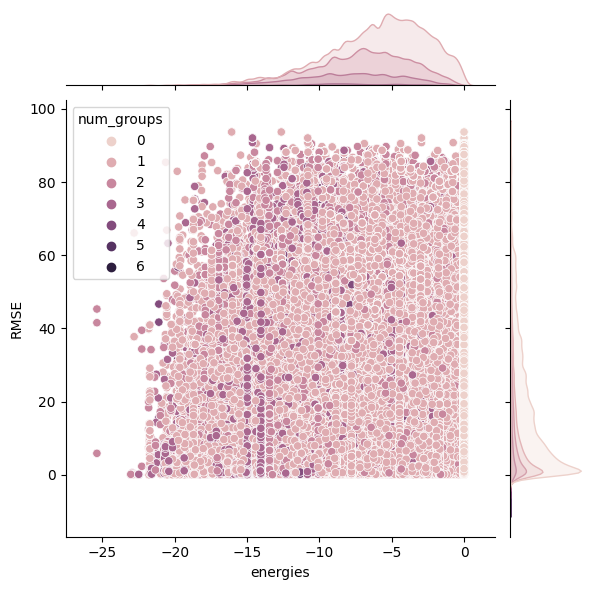

In [16]:
sns.jointplot(infom, x='energies', y='RMSE', hue='num_groups')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


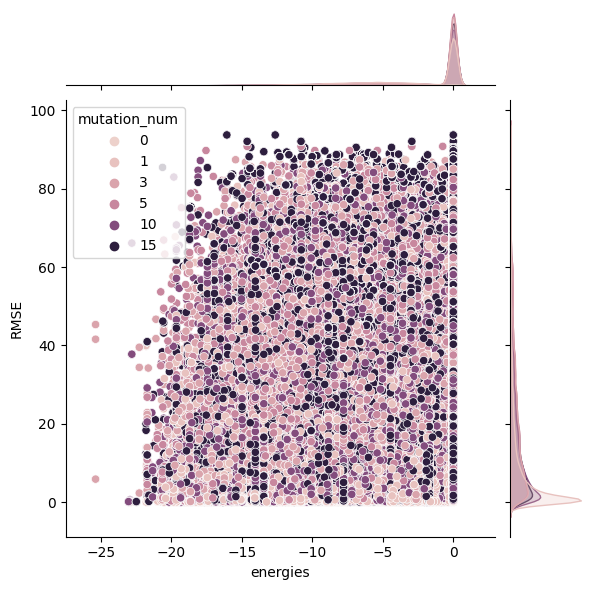

In [17]:
sns.jointplot(infom, x='energies', y='RMSE', hue='mutation_num')

In [18]:
# sns.kdeplot(infom, x='energies', y='RMSE', fill=True, cbar=True)


In [19]:
infom.columns

Index(['circuit_name', 'mutation_name', 'mutation_num', 'mutation_type',
       'mutation_positions', 'path_to_template_circuit', 'name', 'interacting',
       'self_interacting', 'num_interacting', 'num_self_interacting',
       'num_interacting_diff_to_base_circuit',
       'num_self_interacting_diff_to_base_circuit',
       'num_interacting_ratio_from_mutation_to_base',
       'num_self_interacting_ratio_from_mutation_to_base', 'fold_change',
       'final_deriv', 'initial_steady_states', 'max_amount', 'min_amount',
       'overshoot', 'RMSE', 'steady_states', 'response_time_wrt_species-6',
       'response_time_wrt_species-6_diff_to_base_circuit',
       'response_time_wrt_species-6_ratio_from_mutation_to_base',
       'precision_wrt_species-6',
       'precision_wrt_species-6_diff_to_base_circuit',
       'precision_wrt_species-6_ratio_from_mutation_to_base',
       'sensitivity_wrt_species-6',
       'sensitivity_wrt_species-6_diff_to_base_circuit',
       'sensitivity_wrt_specie

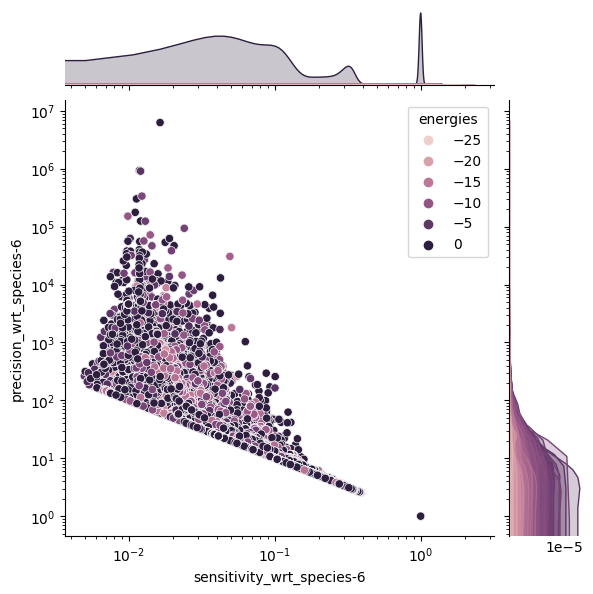

In [20]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
plt.xscale('log')
plt.yscale('log')

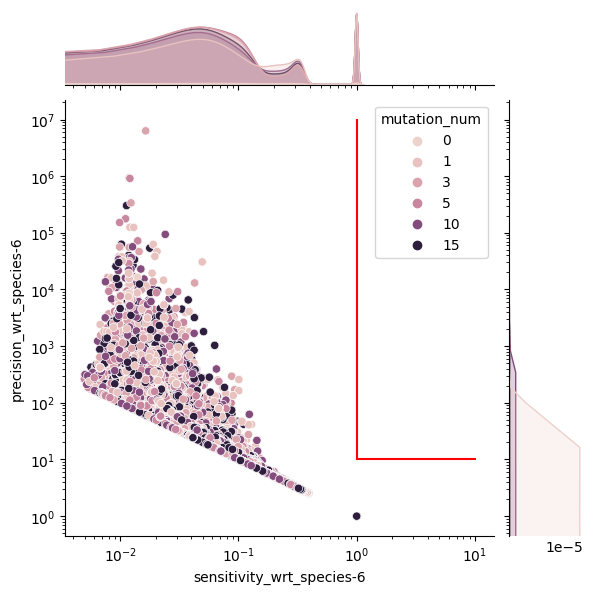

In [21]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

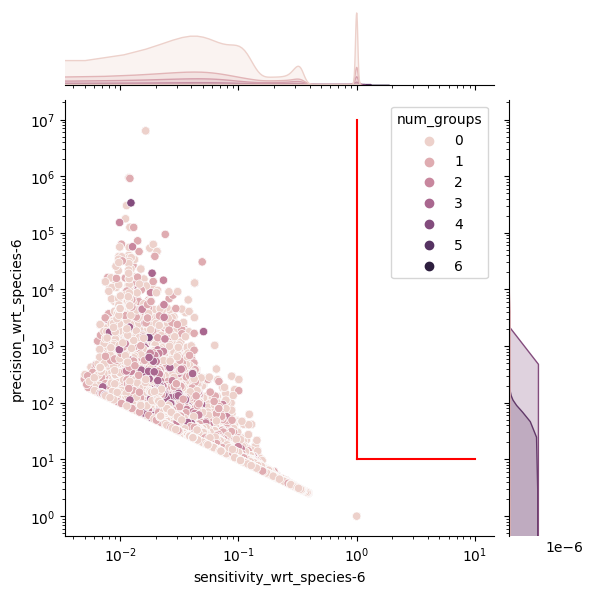

In [22]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='num_groups')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

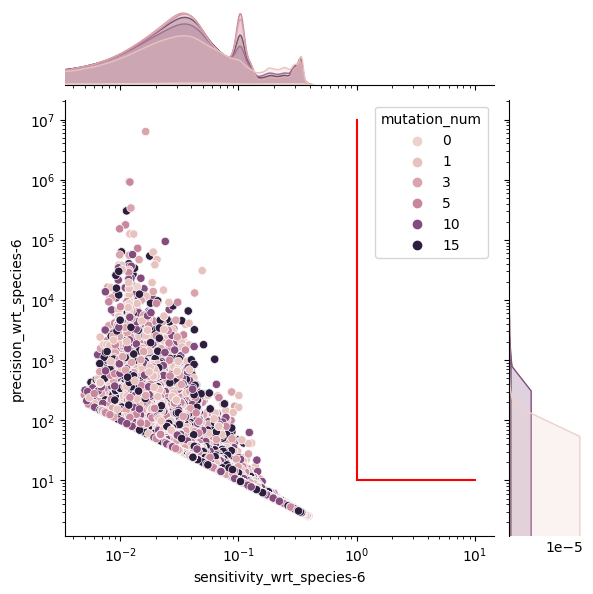

In [23]:
sns.jointplot(infom[infom['sample_name'] != 'RNA_0'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

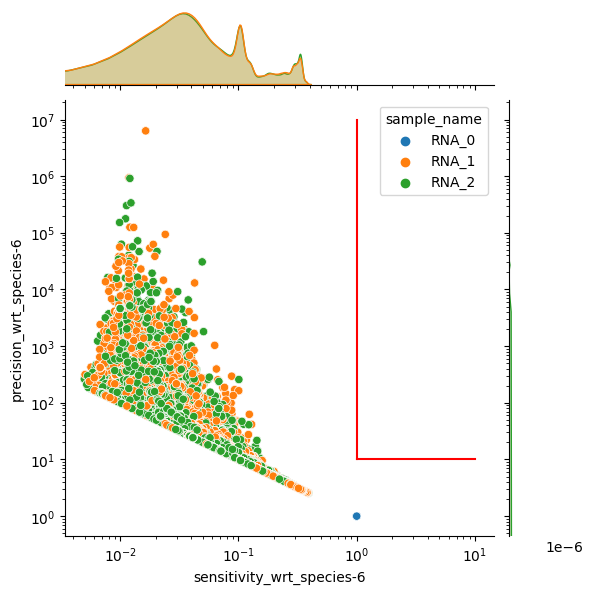

In [24]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='sample_name')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

In [25]:
# sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
# # sns.kdeplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6')
# plt.xscale('log')
# plt.yscale('log')

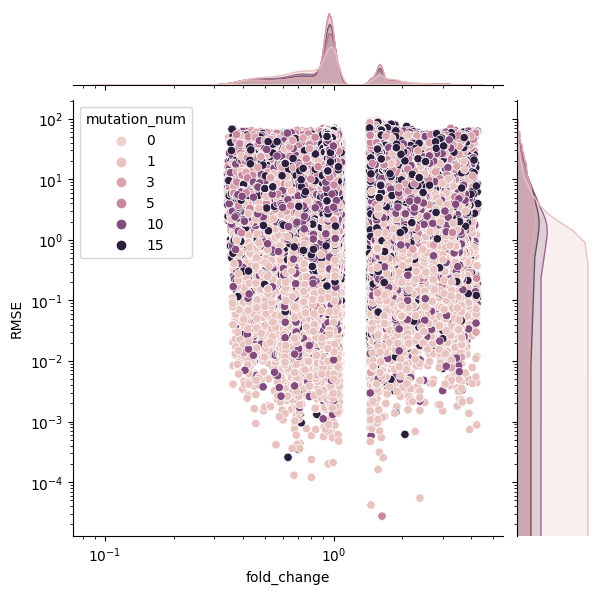

In [26]:
sns.jointplot(infom, x='fold_change', y='RMSE', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


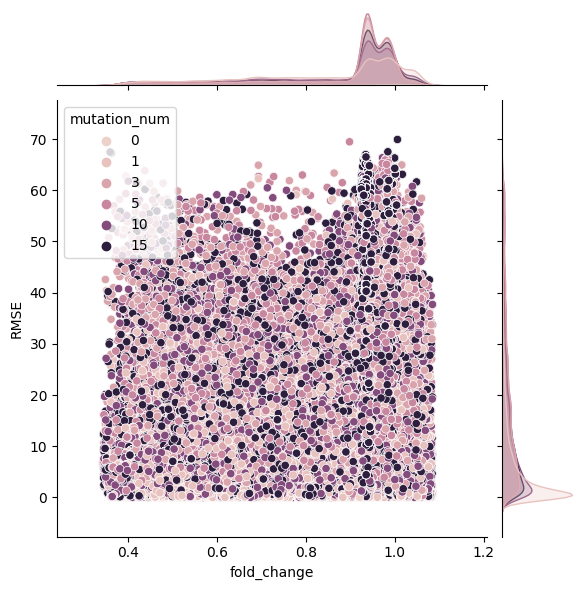

In [27]:
sns.jointplot(infom[infom['sample_name'] != 'RNA_0'], x='fold_change', y='RMSE', hue='mutation_num')
# plt.xscale('log')
# plt.yscale('log')

In [28]:
# sns.jointplot(infom, x='fold_change', y='precision_wrt_species-6', hue='sensitivity_wrt_species-6')
# plt.xscale('log')
# plt.yscale('log')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


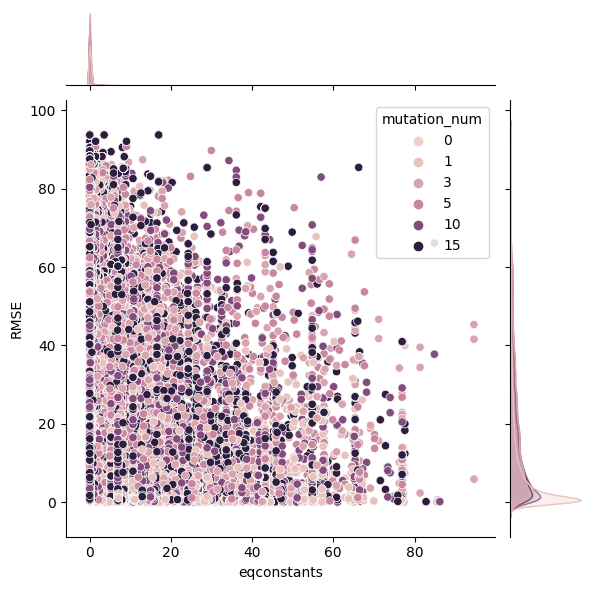

In [29]:
sns.jointplot(infom, x='eqconstants', y='RMSE', hue='mutation_num')

In [30]:
# sns.jointplot(infom, x='binding_rates_dissociation', y='RMSE', hue='mutation_num')

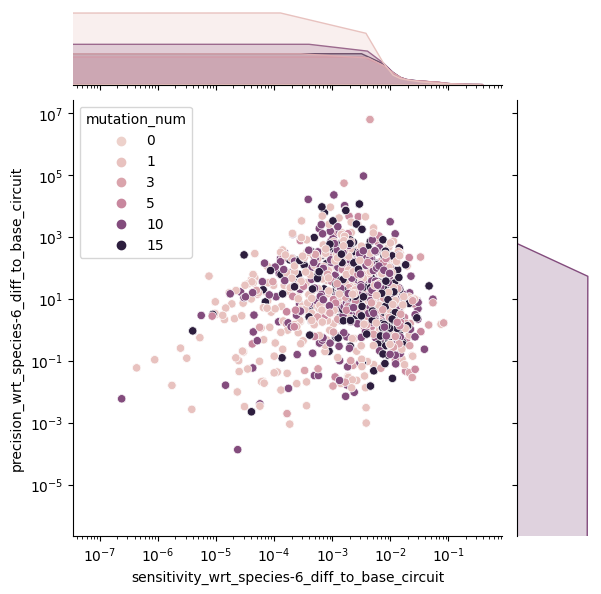

In [31]:
sns.jointplot(infom, x='sensitivity_wrt_species-6_diff_to_base_circuit', y='precision_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

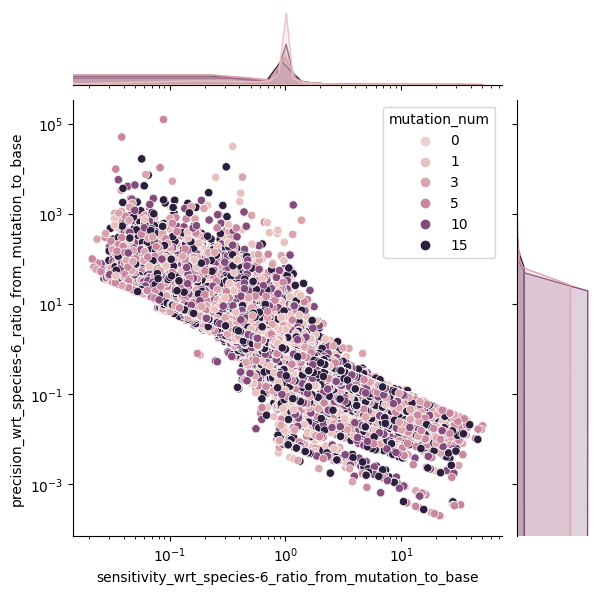

In [32]:
sns.jointplot(infom, x='sensitivity_wrt_species-6_ratio_from_mutation_to_base', y='precision_wrt_species-6_ratio_from_mutation_to_base', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

In [33]:
# sns.scatterplot(infom[infom['mutation_name'] == 'ref_circuit'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
# plt.xscale('log')
# plt.yscale('log')

In [34]:
# sns.jointplot(infom, x='sensitivity_wrt_species-6_diff_to_base_circuit', y='precision_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
# plt.yscale('log')

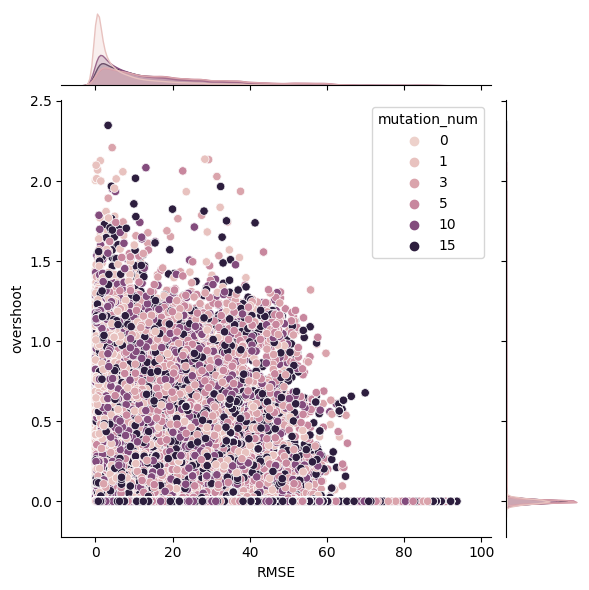

In [35]:
sns.jointplot(infom, x='RMSE', y='overshoot', hue='mutation_num')
# plt.yscale('log')

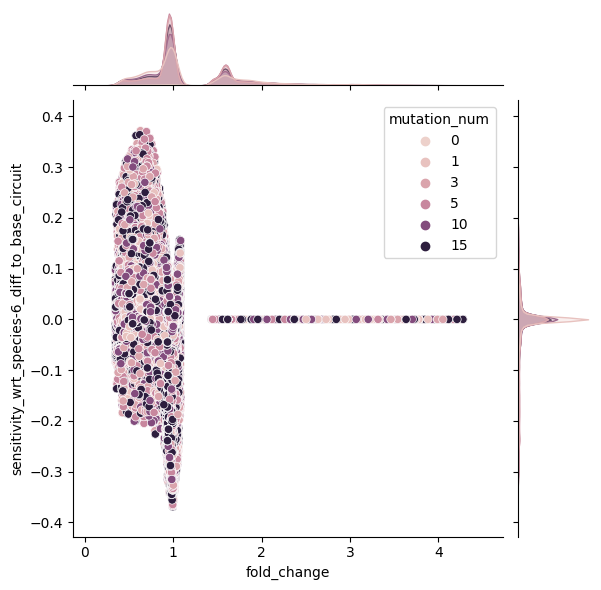

In [36]:
sns.jointplot(infom, x='fold_change', y='sensitivity_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
# sns.kdeplot(infom, x='fold_change', y='sensitivity_wrt_species-6_diff_to_base_circuit') #, fill=True, cbar=True) #, hue='mutation_num')
# plt.yscale('log')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


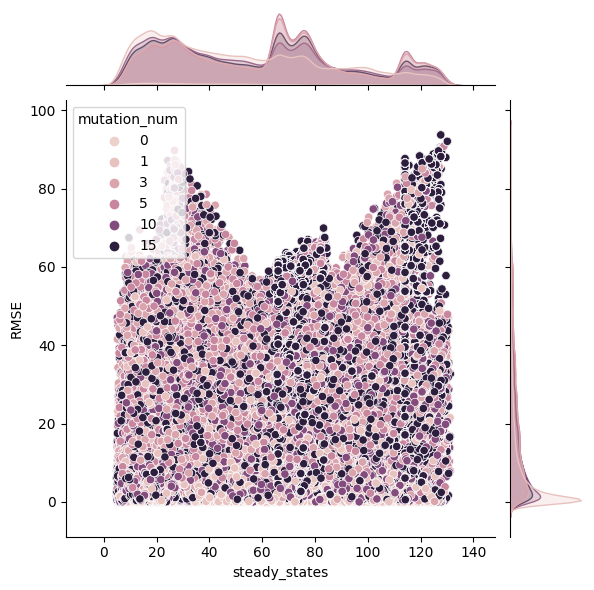

In [37]:
sns.jointplot(infom, x='steady_states', y='RMSE', hue='mutation_num')
# sns.kdeplot(infom, x='steady_states', y='RMSE') #, fill=True, cbar=True) #, hue='mutation_num')

Relevant columns 

In [87]:
relevant_cols = [
    'fold_change', 
    # 'initial_steady_states', 
    # 'max_amount', 'min_amount',
    'overshoot', 
    'RMSE', 
    'steady_states', 
    # 'response_time_wrt_species-6',
    # 'response_time_wrt_species-6_diff_to_base_circuit',
    # 'response_time_wrt_species-6_ratio_from_mutation_to_base',
    'precision_wrt_species-6',
    'precision_wrt_species-6_diff_to_base_circuit',
    'precision_wrt_species-6_ratio_from_mutation_to_base',
    'sensitivity_wrt_species-6',
    'sensitivity_wrt_species-6_diff_to_base_circuit',
    'sensitivity_wrt_species-6_ratio_from_mutation_to_base',
    'fold_change_diff_to_base_circuit',
    # 'initial_steady_states_diff_to_base_circuit',
    # 'max_amount_diff_to_base_circuit', 'min_amount_diff_to_base_circuit',
    'overshoot_diff_to_base_circuit', 
    # 'RMSE_diff_to_base_circuit',
    'steady_states_diff_to_base_circuit',
    'fold_change_ratio_from_mutation_to_base',
    # 'initial_steady_states_ratio_from_mutation_to_base',
    # 'max_amount_ratio_from_mutation_to_base',
    # 'min_amount_ratio_from_mutation_to_base',
    # 'overshoot_ratio_from_mutation_to_base',
    # 'RMSE_ratio_from_mutation_to_base',
    'steady_states_ratio_from_mutation_to_base', 
    # 'num_groups',
    'energies', 
    'binding_rates_dissociation',
    'eqconstants',
    'energies_diffs', 
    'binding_rates_dissociation_diffs',
    'eqconstants_diffs'
    ]

named_aggs = {}
for c in relevant_cols:
    named_aggs.update({c + '_std': pd.NamedAgg(column=c, aggfunc="std")})
    named_aggs.update({c + '_mean': pd.NamedAgg(column=c, aggfunc="mean")})
    named_aggs.update({c + '_std_normed_by_mean': pd.NamedAgg(column=c, aggfunc=lambda x: np.std(x) / np.max([1, np.mean(x)]))})
info_summ = infom.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg(**named_aggs)
    # {c: [np.std, np.mean, lambda x: np.std(x) / np.mean(x)] for c in relevant_cols})


In [88]:
info_summ

,circuit_name,mutation_num,sample_name,fold_change_std,fold_change_mean,fold_change_std_normed_by_mean,overshoot_std,overshoot_mean,overshoot_std_normed_by_mean,RMSE_std,...,eqconstants_std_normed_by_mean,energies_diffs_std,energies_diffs_mean,energies_diffs_std_normed_by_mean,binding_rates_dissociation_diffs_std,binding_rates_dissociation_diffs_mean,binding_rates_dissociation_diffs_std_normed_by_mean,eqconstants_diffs_std,eqconstants_diffs_mean,eqconstants_diffs_std_normed_by_mean
0,toy_mRNA_circuit_10000,0,RNA_0,0.000000,1.924510,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.071000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,toy_mRNA_circuit_10000,0,RNA_1,0.000000,1.025266,0.000000,0.000000,0.765835,0.000000,0.000000,...,0.071000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,toy_mRNA_circuit_10000,0,RNA_2,0.000000,0.685595,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.071000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,toy_mRNA_circuit_10000,1,RNA_0,0.279723,1.908682,0.146213,0.000000,0.000000,0.000000,10.475847,...,0.109921,2.190806,0.477130,2.185728,0.147137,0.035086,0.146796,0.101196,-0.003791,0.100962
4,toy_mRNA_circuit_10000,1,RNA_1,0.064015,0.982058,0.063867,0.387295,0.380210,0.386398,11.212211,...,0.109921,2.190806,0.477130,2.185728,0.147137,0.035086,0.146796,0.101196,-0.003791,0.100962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,toy_mRNA_circuit_36038,10,RNA_1,0.174857,0.734715,0.174452,0.000000,0.000000,0.000000,17.711883,...,0.107270,2.482581,0.720185,2.476827,0.173954,0.061719,0.173551,0.089817,-0.001796,0.089608
17996,toy_mRNA_circuit_36038,10,RNA_2,0.099686,0.956430,0.099455,0.417633,0.363569,0.416665,9.246410,...,0.107270,2.482581,0.720185,2.476827,0.173954,0.061719,0.173551,0.089817,-0.001796,0.089608
17997,toy_mRNA_circuit_36038,15,RNA_0,0.333913,1.886191,0.176620,0.000000,0.000000,0.000000,9.066091,...,0.233733,2.578443,1.044630,2.462564,0.178811,0.089430,0.178396,0.222744,0.006701,0.222228
17998,toy_mRNA_circuit_36038,15,RNA_1,0.180876,0.777251,0.180456,0.000000,0.000000,0.000000,18.884299,...,0.233733,2.578443,1.044630,2.462564,0.178811,0.089430,0.178396,0.222744,0.006701,0.222228


<AxesSubplot: xlabel='RMSE', ylabel='Count'>

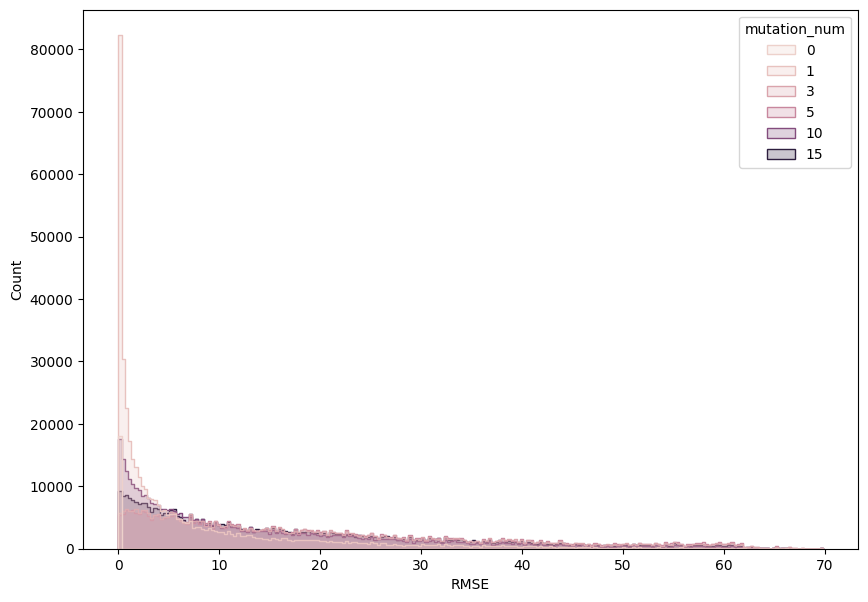

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='RMSE', hue='mutation_num', element='step')


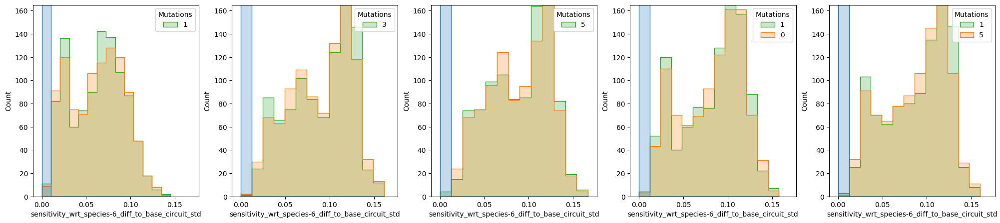

In [42]:
plt.figure(figsize=(5*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(info_summ[info_summ['mutation_num'] == m], x='sensitivity_wrt_species-6_diff_to_base_circuit' + '_std', element='step', hue='sample_name')
        plt.legend(str(m), title='Mutations')
        plt.xlim([info_summ['sensitivity_wrt_species-6_diff_to_base_circuit' + '_std'].min() - 0.01, info_summ['sensitivity_wrt_species-6_diff_to_base_circuit' + '_std'].max() + 0.01])
        plt.ylim([0,165])


<AxesSubplot: xlabel='sensitivity_wrt_species-6_diff_to_base_circuit_std', ylabel='Count'>

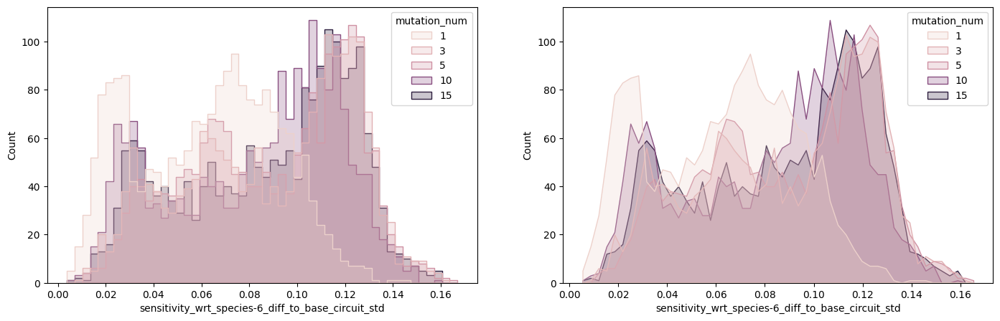

In [120]:
plt.figure(figsize=(17,5))
ax = plt.subplot(1,2,1)
sns.histplot(info_summ[(info_summ['sensitivity_wrt_species-6_diff_to_base_circuit' + '_std'] > 0) & (info_summ['sample_name'] != 'RNA_0')], x='sensitivity_wrt_species-6_diff_to_base_circuit' + '_std', hue='mutation_num', element="step", bins=50)
ax = plt.subplot(1,2,2)
sns.histplot(info_summ[(info_summ['sensitivity_wrt_species-6_diff_to_base_circuit' + '_std'] > 0) & (info_summ['sample_name'] != 'RNA_0')], x='sensitivity_wrt_species-6_diff_to_base_circuit' + '_std', hue='mutation_num', element="poly", bins=50)


<AxesSubplot: xlabel='precision_wrt_species-6_diff_to_base_circuit_std', ylabel='Count'>

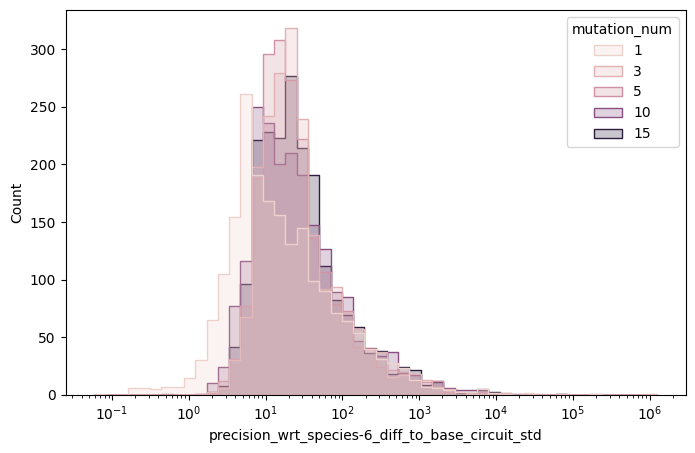

In [44]:
plt.figure(figsize=(8,5))
sns.histplot(info_summ[(info_summ['mutation_num'] != 0) & (info_summ['sample_name'] != 'RNA_0')], x='precision_wrt_species-6_diff_to_base_circuit' + '_std', hue='mutation_num', element="step", bins=50, log_scale=[True, False])


Mutational stability?

In [109]:
info_summ['precision_times_sensitivity' + '_std'] = info_summ['precision_wrt_species-6' + '_std'] * info_summ['sensitivity_wrt_species-6' + '_std']
info_summ['precision_times_sensitivity' + '_mean'] = info_summ['precision_wrt_species-6' + '_mean'] * info_summ['sensitivity_wrt_species-6' + '_mean']


<AxesSubplot: xlabel='precision_times_sensitivity_mean', ylabel='Count'>

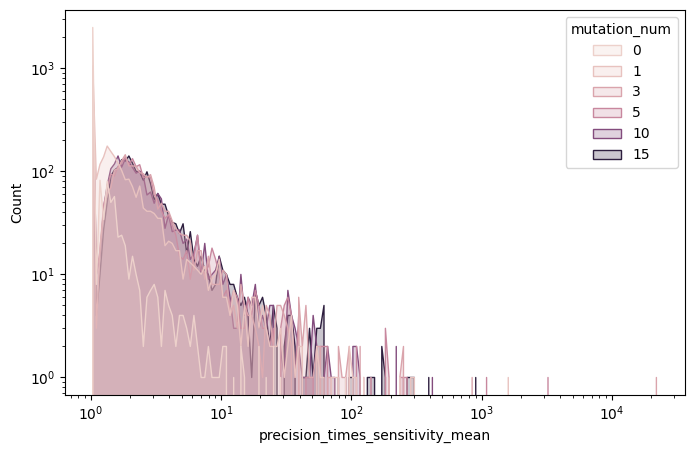

In [118]:
plt.figure(figsize=(8,5))
sns.histplot(info_summ, x='precision_times_sensitivity' + '_mean', hue='mutation_num', element="poly", log_scale=[True, True])
# sns.histplot(info_summ[info_summ['mutation_num'] != 0], x='precision_times_sensitivity' + '_mean', hue='mutation_num', element="step", bins=50, log_scale=[True, True])
# sns.histplot(info_summ, x=('precision_times_sensitivity', 'mean'), hue='mutation_num', element="step", bins=50, log_scale=[True, False])


More standard deviations

In [47]:
stds = info_summ.groupby(['mutation_num'], as_index=False).agg({c + '_std': 'std' for c in relevant_cols + ['precision_times_sensitivity']})
means = info_summ.groupby(['mutation_num'], as_index=False).agg({c + '_mean': 'mean' for c in relevant_cols + ['precision_times_sensitivity']})
for c in means.columns:
    stds[c] = means[c]

stds

,mutation_num,fold_change_std,overshoot_std,RMSE_std,steady_states_std,precision_wrt_species-6_std,precision_wrt_species-6_diff_to_base_circuit_std,precision_wrt_species-6_ratio_from_mutation_to_base_std,sensitivity_wrt_species-6_std,sensitivity_wrt_species-6_diff_to_base_circuit_std,...,steady_states_diff_to_base_circuit_mean,fold_change_ratio_from_mutation_to_base_mean,steady_states_ratio_from_mutation_to_base_mean,energies_mean,binding_rates_dissociation_mean,eqconstants_mean,energies_diffs_mean,binding_rates_dissociation_diffs_mean,eqconstants_diffs_mean,precision_times_sensitivity_mean
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,-3.394831,0.243098,0.536169,0.000000,0.000000,0.000000,1.405431
1,1,0.131839,0.125254,4.678034,5.537230,3517.731789,3517.731716,120.097483,0.037974,0.037974,...,3.188075,1.017308,1.164937,-2.986799,0.270301,0.489018,0.408032,0.027203,-0.047152,3.326055
2,3,0.168927,0.100313,6.547076,6.130042,23089.350472,23089.350339,51.972693,0.050849,0.050849,...,12.264426,1.057326,1.634456,-1.895966,0.338146,0.330832,1.498865,0.095049,-0.205337,11.272949
3,5,0.167254,0.097534,6.731558,6.232899,3469.966257,3469.966229,497.032167,0.050490,0.050490,...,13.027732,1.058463,1.667827,-1.822345,0.342553,0.322815,1.572486,0.099455,-0.213355,4.898887
4,10,0.162489,0.129873,5.253060,5.627026,586.403383,586.403382,43.101609,0.048285,0.048285,...,7.416475,1.037314,1.383546,-2.466197,0.303406,0.424261,0.928634,0.060308,-0.111909,3.602506
5,15,0.169605,0.118507,5.835704,5.682307,1217.199089,1217.199091,86.800095,0.050478,0.050478,...,9.833790,1.048030,1.509769,-2.174515,0.321410,0.375301,1.220316,0.078313,-0.160869,4.066374


In [50]:
std_m = stds.melt(id_vars=['mutation_num'], value_vars=[sc for sc in stds.columns if (sc != 'mutation_num') and ('std' in sc)], value_name='analytic_value', var_name='analytic').rename(columns={'mutation_num': 'mutation_num'})
std_m2 = std_m.groupby(['analytic']).apply(lambda x: x / x.max())
std_m2['analytic'] = std_m['analytic']


/tmp/ipykernel_543694/2482964636.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  std_m2 = std_m.groupby(['analytic']).apply(lambda x: x / x.max())


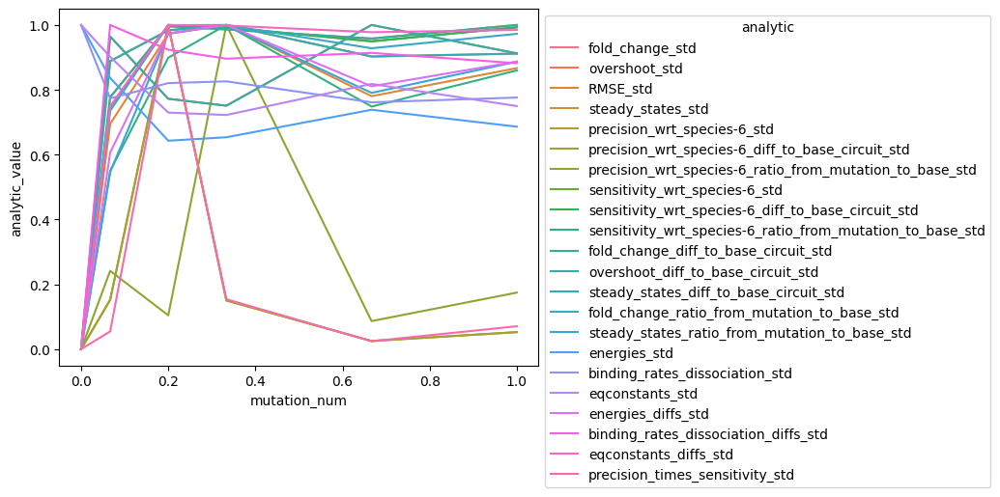

In [51]:
# sns.lineplot(stds, x='mutation_num', y=('precision_times_sensitivity', 'std'))
ax = sns.lineplot(std_m2, 
             x='mutation_num', y='analytic_value', hue='analytic')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

<AxesSubplot: xlabel='mutation_num', ylabel='fold_change_std_normed_by_mean'>

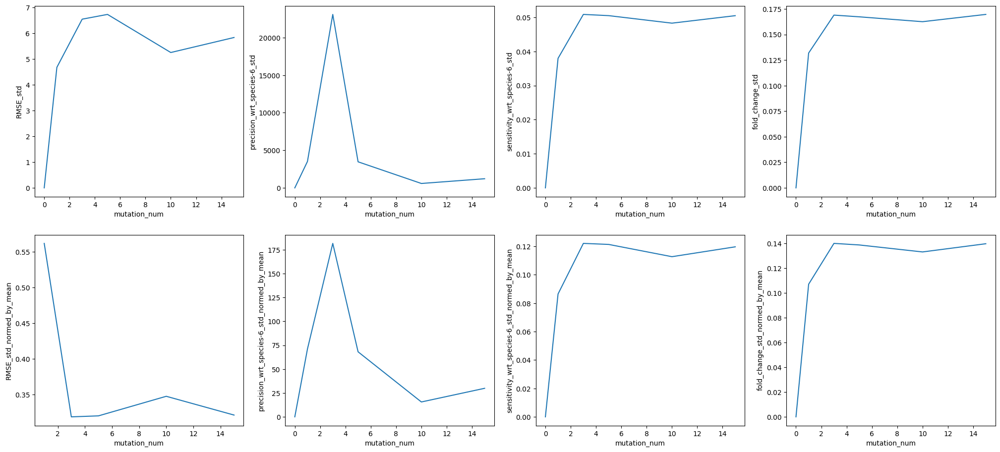

In [52]:
std_cols = ['RMSE',
            'precision_wrt_species-6',
            'sensitivity_wrt_species-6',
            'fold_change']
for sc in std_cols:
    stds[sc + '_std_normed_by_mean'] = stds[sc + '_std'] / stds[sc + '_mean']

plt.figure(figsize=(25, 11))
ax = plt.subplot(2, 4, 1)
sns.lineplot(stds, x='mutation_num', y='RMSE' + '_std')
ax = plt.subplot(2, 4, 2)
sns.lineplot(stds, x='mutation_num', y=
    'precision_wrt_species-6' + '_std')
ax = plt.subplot(2, 4, 3)
sns.lineplot(stds, x='mutation_num', y=
    'sensitivity_wrt_species-6' + '_std')
ax = plt.subplot(2, 4, 4)
sns.lineplot(stds, x='mutation_num', y='fold_change' + '_std')

ax = plt.subplot(2, 4, 5)
sns.lineplot(stds, x='mutation_num', y='RMSE' + '_std_normed_by_mean')
ax = plt.subplot(2, 4, 6)
sns.lineplot(stds, x='mutation_num', y=
    'precision_wrt_species-6' + '_std_normed_by_mean')
ax = plt.subplot(2, 4, 7)
sns.lineplot(stds, x='mutation_num', y=
    'sensitivity_wrt_species-6' + '_std_normed_by_mean')
ax = plt.subplot(2, 4, 8)
sns.lineplot(stds, x='mutation_num', y='fold_change' + '_std_normed_by_mean')


In [ ]:
info_summ['precision_times_sensitivity']

,std,mean
0,8.524117,7.625858
1,29.324269,10.079686
2,8.336450,5.722051
3,7.553016,4.906790
4,7.205234,5.373480
...,...,...
5995,46.226831,14.289890
5996,3.629719,3.818976
5997,8.676155,5.022808
5998,51.856584,13.395987


<Figure size 800x500 with 0 Axes>

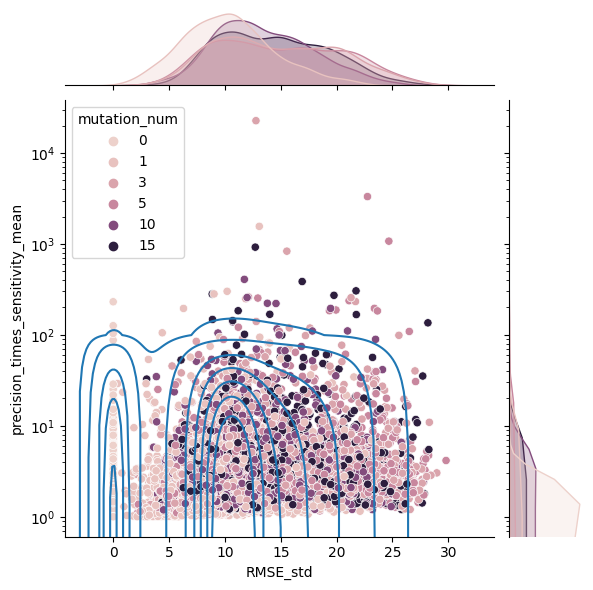

In [53]:
plt.figure(figsize=(8,5))
sns.jointplot(info_summ[info_summ['sample_name'] != 'RNA_0'], x='RMSE' + '_std', y='precision_times_sensitivity' + '_mean', hue='mutation_num')
sns.kdeplot(info_summ[info_summ['sample_name'] != 'RNA_0'], x='RMSE' + '_std', y='precision_times_sensitivity' + '_mean')
plt.yscale('log')

In [54]:
info_summ

,circuit_name,mutation_num,sample_name,fold_change_std,fold_change_mean,fold_change_std_normed_bymean,overshoot_std,overshoot_mean,overshoot_std_normed_bymean,RMSE_std,...,energies_diffs_mean,energies_diffs_std_normed_bymean,binding_rates_dissociation_diffs_std,binding_rates_dissociation_diffs_mean,binding_rates_dissociation_diffs_std_normed_bymean,eqconstants_diffs_std,eqconstants_diffs_mean,eqconstants_diffs_std_normed_bymean,precision_times_sensitivity_std,precision_times_sensitivity_mean
0,toy_mRNA_circuit_10000,0,RNA_0,0.000000,1.924510,0.000000,0.000000,0.000000,NaN,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000
1,toy_mRNA_circuit_10000,0,RNA_1,0.000000,1.025266,0.000000,0.000000,0.765835,0.000000,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.514016
2,toy_mRNA_circuit_10000,0,RNA_2,0.000000,0.685595,0.000000,0.000000,0.000000,NaN,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000
3,toy_mRNA_circuit_10000,1,RNA_0,0.279723,1.908682,0.146213,0.000000,0.000000,NaN,10.475847,...,0.477130,4.580995,0.147137,0.035086,4.183862,0.101196,-0.003791,-26.632678,0.000000,1.000000
4,toy_mRNA_circuit_10000,1,RNA_1,0.064015,0.982058,0.065033,0.387295,0.380210,1.016276,11.212211,...,0.477130,4.580995,0.147137,0.035086,4.183862,0.101196,-0.003791,-26.632678,13.212774,5.549641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,toy_mRNA_circuit_36038,10,RNA_1,0.174857,0.734715,0.237442,0.000000,0.000000,NaN,17.711883,...,0.720185,3.439153,0.173954,0.061719,2.811948,0.089817,-0.001796,-49.880804,0.988171,1.814351
17996,toy_mRNA_circuit_36038,10,RNA_2,0.099686,0.956430,0.103986,0.417633,0.363569,1.146041,9.246410,...,0.720185,3.439153,0.173954,0.061719,2.811948,0.089817,-0.001796,-49.880804,50.766936,17.167111
17997,toy_mRNA_circuit_36038,15,RNA_0,0.333913,1.886191,0.176620,0.000000,0.000000,NaN,9.066091,...,1.044630,2.462564,0.178811,0.089430,1.994813,0.222744,0.006701,33.165453,0.000000,1.000000
17998,toy_mRNA_circuit_36038,15,RNA_1,0.180876,0.777251,0.232173,0.000000,0.000000,NaN,18.884299,...,1.044630,2.462564,0.178811,0.089430,1.994813,0.222744,0.006701,33.165453,0.648473,1.614600


In [57]:
import plotly.express as px
info_summ['robust'] = (info_summ['sensitivity_wrt_species-6' + '_mean'] > 0.9) & (info_summ['precision_wrt_species-6' + '_mean'] > 5)
fig = px.scatter_3d(
    info_summ[info_summ['mutation_num'] != 0],
    x='sensitivity_wrt_species-6' + '_mean', y='precision_wrt_species-6' + '_mean', z='RMSE' + '_std', 
    color='mutation_num', symbol='robust', log_y=True, log_z=True)
fig.show()


## Examine correlations

In [133]:
infom.corr()

/tmp/ipykernel_543694/1676457137.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,mutation_num,num_interacting,num_self_interacting,num_interacting_diff_to_base_circuit,num_self_interacting_diff_to_base_circuit,num_interacting_ratio_from_mutation_to_base,num_self_interacting_ratio_from_mutation_to_base,fold_change,final_deriv,initial_steady_states,...,steady_states_ratio_from_mutation_to_base,energies,idx_species_binding,num_groups,binding_rates_dissociation,eqconstants,binding_rates_dissociation_diffs,eqconstants_diffs,energies_diffs,frac_muts_in_binding_site
mutation_num,1.000000e+00,-9.530665e-02,2.373374e-03,9.540692e-02,-3.278481e-03,-9.489277e-02,-8.589493e-03,-2.842668e-03,4.501443e-03,2.642580e-02,...,3.237458e-02,0.024726,2.851534e-14,-0.027853,0.031330,-0.004384,0.033489,-0.004731,0.026977,-0.002333
num_interacting,-9.530665e-02,1.000000e+00,3.830339e-02,-9.583234e-01,-3.278960e-02,9.831055e-01,4.472524e-02,4.083363e-02,-3.132920e-02,-3.563673e-01,...,-3.058642e-01,-0.280287,-4.654497e-14,0.319310,-0.340958,0.057395,-0.343445,0.054222,-0.282451,0.004385
num_self_interacting,2.373374e-03,3.830339e-02,1.000000e+00,-3.372039e-02,-3.530742e-01,3.615222e-02,8.424181e-01,-4.380908e-02,-8.977466e-02,-2.278249e-01,...,-1.103527e-01,-0.168770,-3.954955e-14,0.134463,-0.177634,0.057549,-0.057196,0.035543,-0.060967,-0.009402
num_interacting_diff_to_base_circuit,9.540692e-02,-9.583234e-01,-3.372039e-02,1.000000e+00,3.364191e-02,-9.896260e-01,-4.369925e-02,-3.916551e-02,3.063273e-02,3.411510e-01,...,3.129282e-01,0.268565,4.344160e-14,-0.302081,0.326253,-0.057636,0.358416,-0.054680,0.294581,-0.001341
num_self_interacting_diff_to_base_circuit,-3.278481e-03,-3.278960e-02,-3.530742e-01,3.364191e-02,1.000000e+00,-3.327272e-02,-2.484679e-01,4.879388e-03,2.918762e-02,1.295387e-01,...,1.632709e-01,0.070711,2.985480e-15,-0.053157,0.070483,-0.033542,0.141421,-0.049416,0.138803,-0.014261
num_interacting_ratio_from_mutation_to_base,-9.489277e-02,9.831055e-01,3.615222e-02,-9.896260e-01,-3.327272e-02,1.000000e+00,4.458163e-02,4.062497e-02,-3.075583e-02,-3.513881e-01,...,-3.129785e-01,-0.275585,2.810761e-14,0.311325,-0.334939,0.058091,-0.354613,0.054956,-0.291497,0.003202
num_self_interacting_ratio_from_mutation_to_base,-8.589493e-03,4.472524e-02,8.424181e-01,-4.369925e-02,-2.484679e-01,4.458163e-02,1.000000e+00,-3.964855e-02,-7.666950e-02,-1.828555e-01,...,-9.992793e-02,-0.146526,2.100022e-14,0.117389,-0.154558,0.051611,-0.047726,0.029553,-0.050871,-0.011542
fold_change,-2.842668e-03,4.083363e-02,-4.380908e-02,-3.916551e-02,4.879388e-03,4.062497e-02,-3.964855e-02,1.000000e+00,8.624989e-01,-1.075714e-01,...,-7.930888e-02,-0.019522,3.562593e-14,0.011307,-0.010788,0.009704,-0.013514,0.002255,-0.011825,0.000996
final_deriv,4.501443e-03,-3.132920e-02,-8.977466e-02,3.063273e-02,2.918762e-02,-3.075583e-02,-7.666950e-02,8.624989e-01,1.000000e+00,7.559492e-02,...,-7.857363e-02,0.025617,8.722397e-15,-0.020393,0.026633,-0.009302,0.014915,-0.003113,0.013728,0.001449
initial_steady_states,2.642580e-02,-3.563673e-01,-2.278249e-01,3.411510e-01,1.295387e-01,-3.513881e-01,-1.828555e-01,-1.075714e-01,7.559492e-02,1.000000e+00,...,3.359514e-01,0.190238,2.303915e-15,-0.153139,0.179687,-0.062432,0.141403,-0.031061,0.125434,-0.000636


In [135]:
v = infom[infom['sample_name'] != 'RNA_0'].corr()['mutation_num'].sort_values()
v.to_csv('corrs.csv')
v

/tmp/ipykernel_543694/4008863527.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



num_interacting                                           -9.530665e-02
num_interacting_ratio_from_mutation_to_base               -9.489277e-02
overshoot                                                 -3.491014e-02
sensitivity_wrt_species-6_diff_to_base_circuit            -2.956556e-02
sensitivity_wrt_species-6                                 -2.904618e-02
num_groups                                                -2.785256e-02
overshoot_diff_to_base_circuit                            -2.491870e-02
num_self_interacting_ratio_from_mutation_to_base          -8.589493e-03
response_time_wrt_species-6                               -8.540372e-03
response_time_wrt_species-6_diff_to_base_circuit          -8.134406e-03
eqconstants_diffs                                         -4.731285e-03
eqconstants                                               -4.383848e-03
num_self_interacting_diff_to_base_circuit                 -3.278481e-03
frac_muts_in_binding_site                                 -2.333

<AxesSubplot: xlabel='sensitivity_wrt_species-6_diff_to_base_circuit', ylabel='Count'>

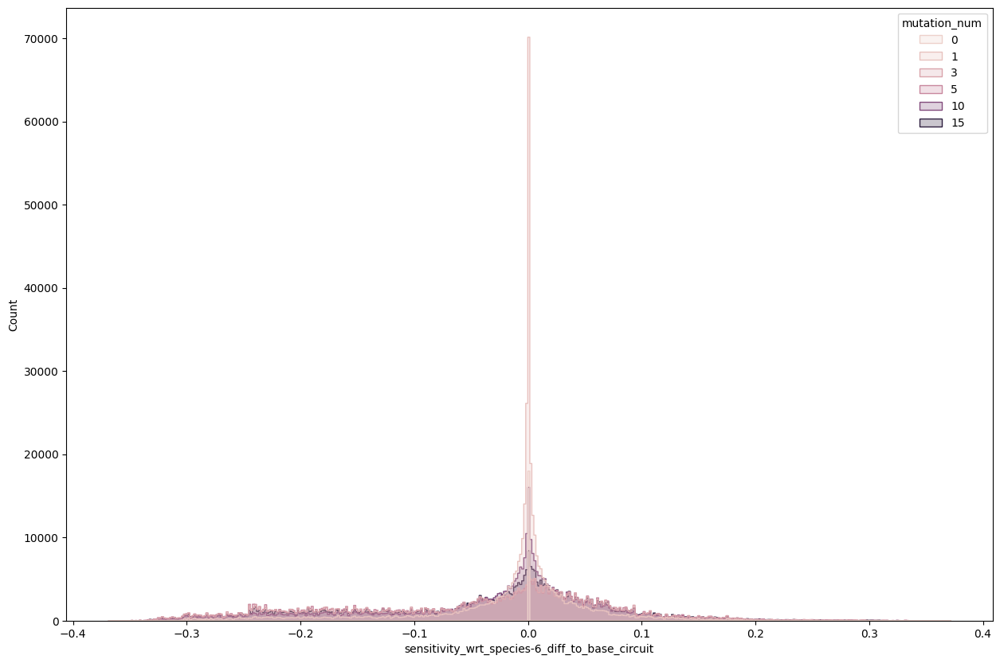

In [60]:
plt.figure(figsize=(15,10))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='sensitivity_wrt_species-6_diff_to_base_circuit', hue='mutation_num', element='step')


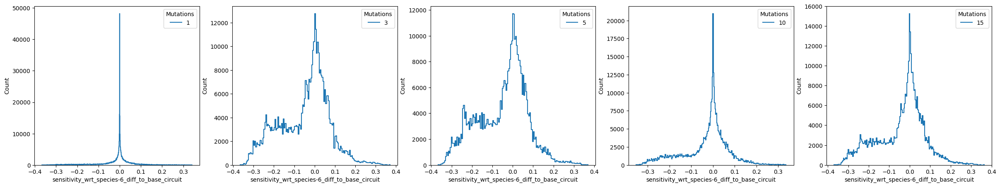

In [64]:
plt.figure(figsize=(6*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(infom[(infom['sample_name'] != 'RNA_0') & (infom['mutation_num'] == m)], x='sensitivity_wrt_species-6_diff_to_base_circuit', stat='count', element='step', fill=False)
        plt.legend([str(m)], title='Mutations')
        # plt.xlim([info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].min() - 0.01, info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].max() + 0.01])
        # plt.ylim([0,165])


## Energies

<AxesSubplot: xlabel='binding_rates_dissociation', ylabel='Count'>

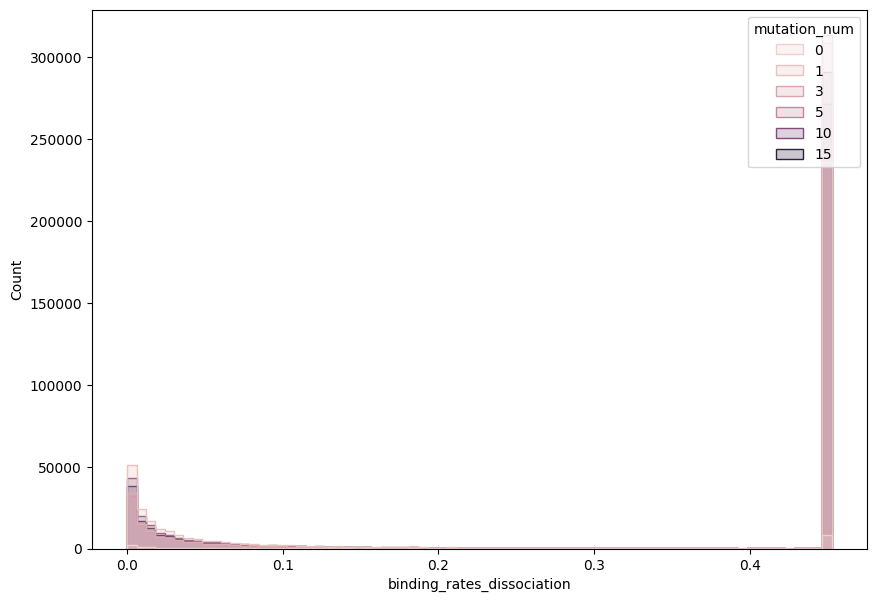

In [65]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='binding_rates_dissociation', hue='mutation_num', element='step')


<AxesSubplot: xlabel='binding_rates_dissociation_diffs', ylabel='Count'>

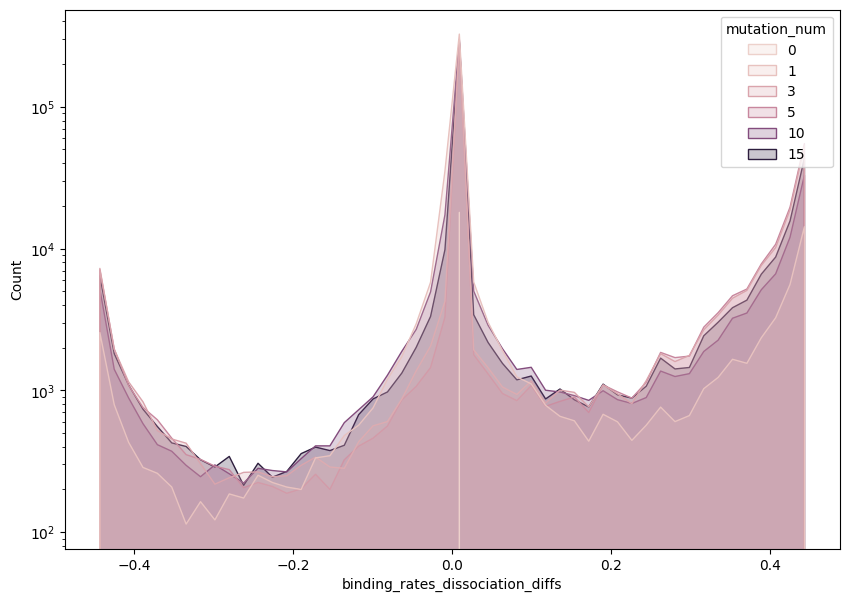

In [140]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='binding_rates_dissociation_diffs', hue='mutation_num', element='poly', bins=50, log_scale=[False, True])


<AxesSubplot: xlabel='energies_diffs', ylabel='Count'>

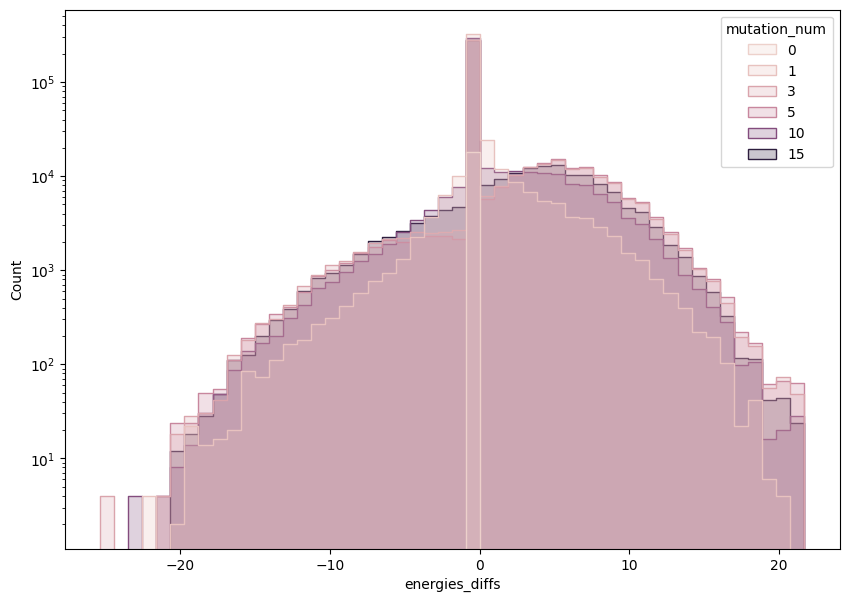

In [146]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='energies_diffs', hue='mutation_num', element='step', bins=50, log_scale=[False, True])


/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


ValueError: autodetected range of [-inf, -0.6035562706495659] is not finite

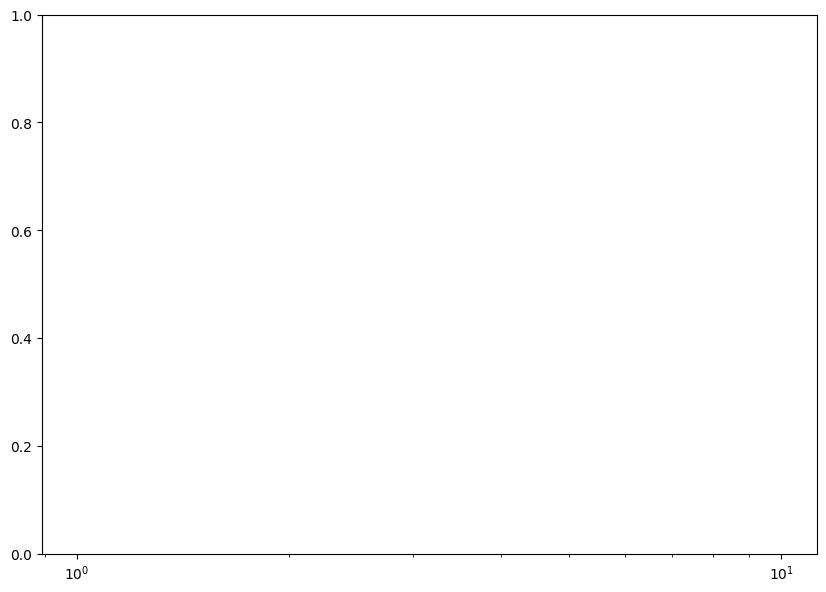

In [73]:
plt.figure(figsize=(10,7))
sns.histplot(info_summ[info_summ['binding_rates_dissociation_diffs' + '_std_normed_by_mean'] < 1e3], x='binding_rates_dissociation_diffs' + '_std_normed_by_mean', hue='mutation_num', element='step', bins=50, log_scale=[True, False])
plt.title('Difference in $k_d$ between mutated and\nreference circuits, cut of at $10^3$')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


ValueError: autodetected range of [-inf, -0.6035562706495659] is not finite

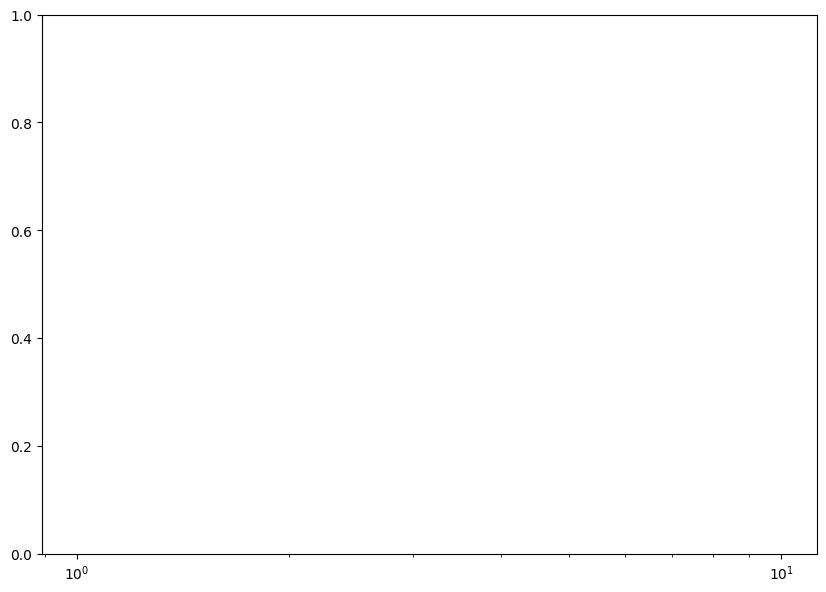

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(info_summ[info_summ['binding_rates_dissociation_diffs' + '_std_normed_by_mean'] < 1e3], x='binding_rates_dissociation_diffs' + '_std_normed_by_mean', hue='mutation_num', element='poly', bins=50, log_scale=[True, False])
plt.title('Difference in $k_d$ between mutated and\nreference circuits, cut of at $10^3$')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


ValueError: autodetected range of [-inf, 0.7537877065294454] is not finite

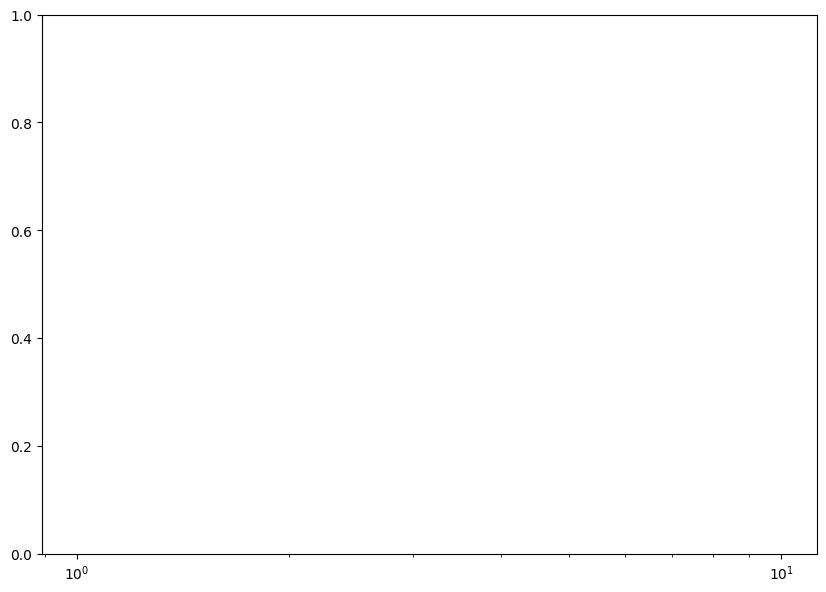

In [ ]:
plt.figure(figsize=(10,7))
sns.histplot(info_summ, x='energies_diffs' + '_std_normed_by_mean', hue='mutation_num', element='poly', bins=50, log_scale=[True, False])
plt.title('Difference in $k_d$ between mutated and reference circuits')

<AxesSubplot: xlabel='eqconstants', ylabel='Count'>

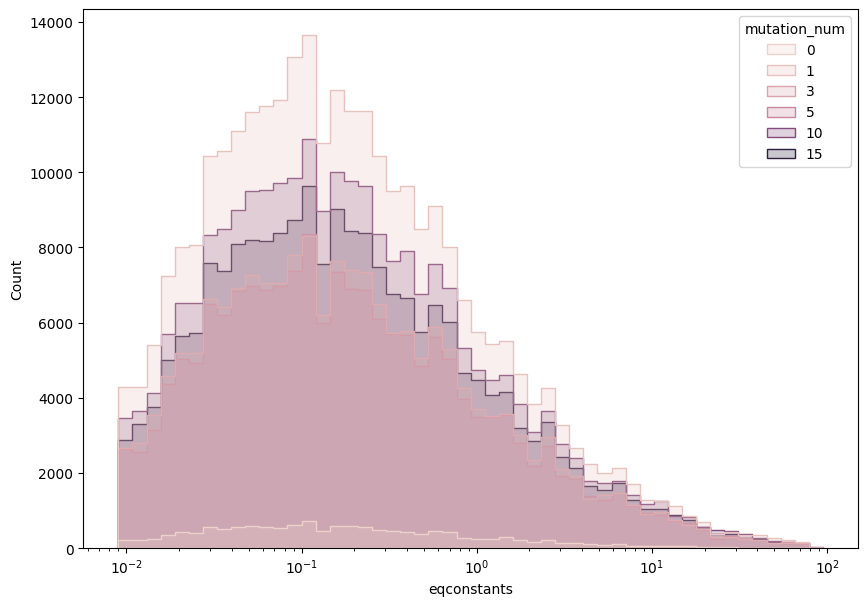

In [67]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['eqconstants'] > 0.009], x='eqconstants', hue = 'mutation_num', multiple='layer', element='step', stat='count', log_scale=[True, False], bins=50)
# plt.xscale('log')


<AxesSubplot: xlabel='eqconstants', ylabel='Count'>

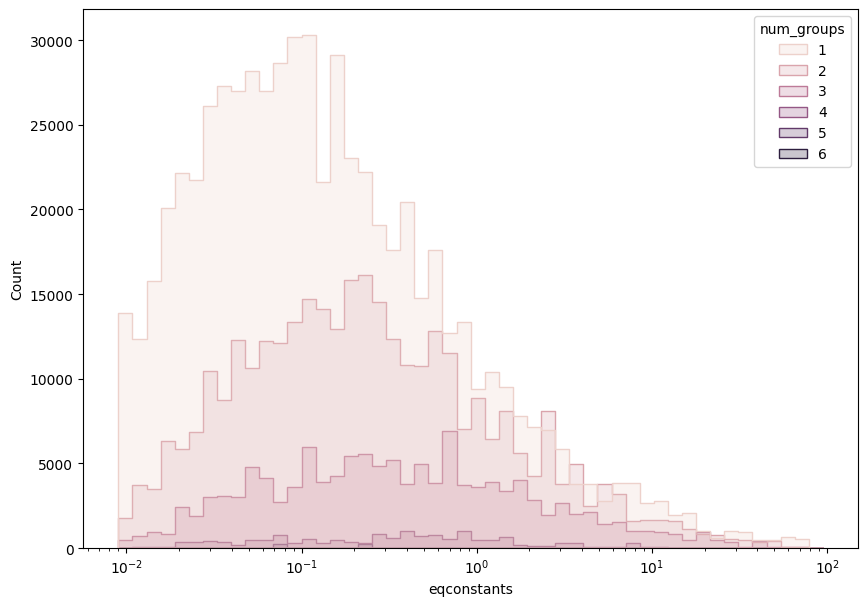

In [68]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['eqconstants'] > 0.009], x='eqconstants', hue = 'num_groups', multiple='layer', element='step', stat='count', log_scale=[True, False], bins=50)


<Figure size 1000x700 with 0 Axes>

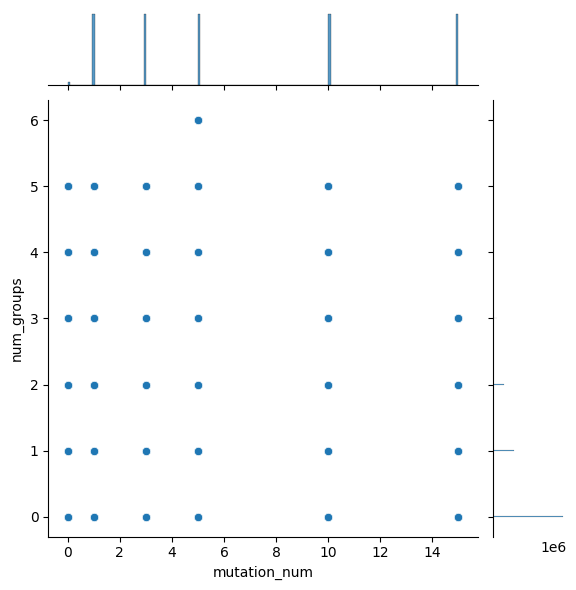

In [69]:
plt.figure(figsize=(10,7))
sns.jointplot(infom, x='mutation_num', y = 'num_groups')


In [70]:
infom['eqconstants'].mode()

0    0.00667
Name: eqconstants, dtype: float64

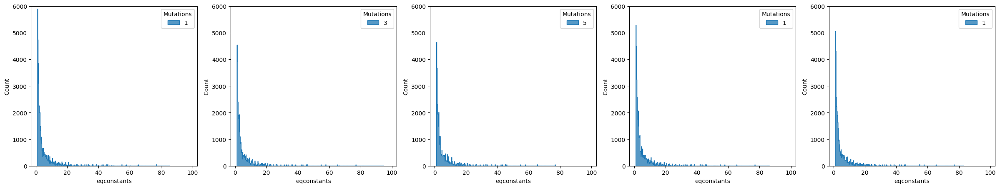

In [71]:
plt.figure(figsize=(6*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(infom[(infom['eqconstants'] >= 1) & (infom['mutation_num'] == m)], x='eqconstants', stat='count', element='step', fill=True)
        plt.legend(str(m), title='Mutations')
        plt.xlim([-3, 103])
        plt.ylim([0,6000])


<AxesSubplot: xlabel='energies', ylabel='Count'>

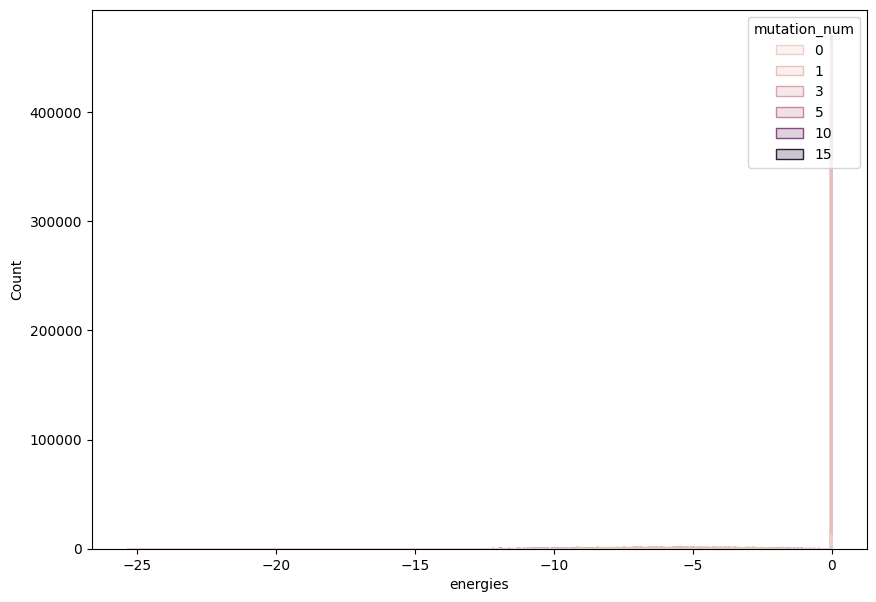

In [72]:
plt.figure(figsize=(10,7))
sns.histplot(infom, x='energies', hue='mutation_num', element='step')


In [ ]:
len(relevant_cols)

18

core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593

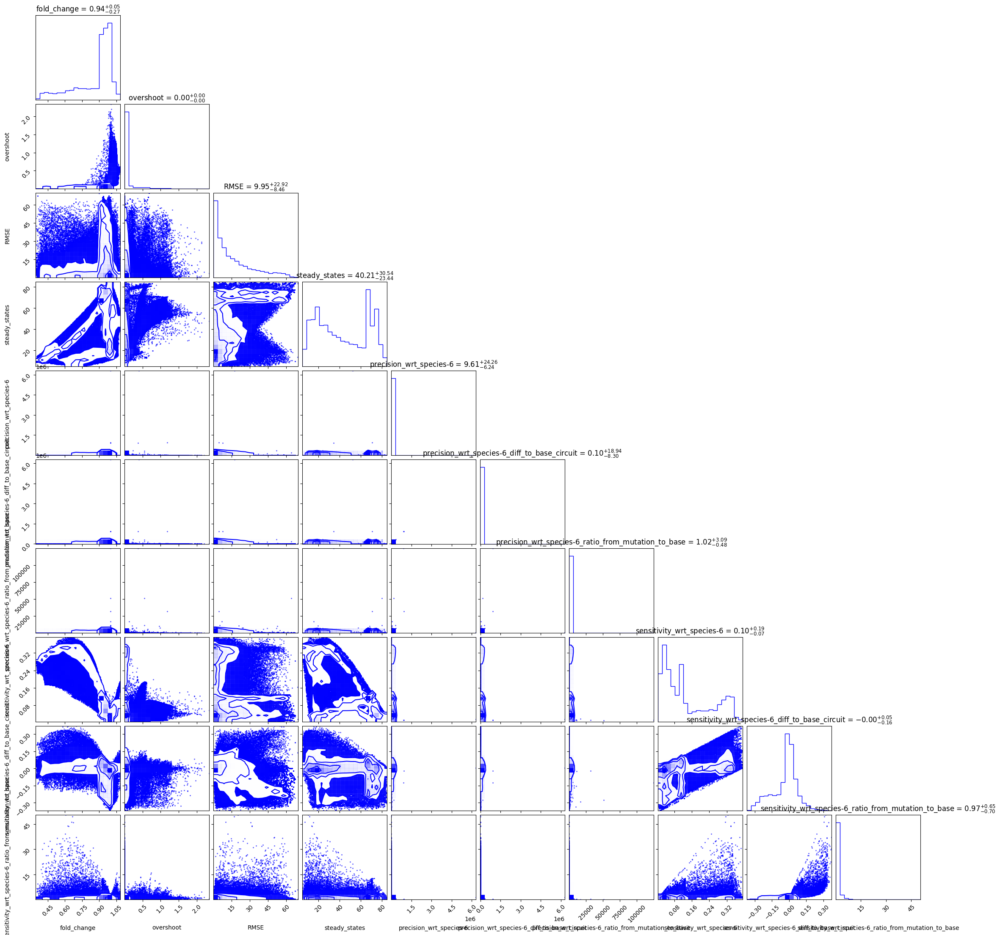

In [73]:
cols = relevant_cols[0:10]
temp = infom[(infom['sample_name'] != 'RNA_0') & (infom['precision_wrt_species-6'] != np.inf) & (infom['precision_wrt_species-6_diff_to_base_circuit'] != -np.inf)][cols]
# for c in cols:
#     if 'precision' in c:
#         temp[c] = np.log(temp[c])
fig = corner.corner(temp, labels=cols, show_titles=True, title_kwargs={"fontsize": 12}, color='b')

In [74]:
infom[relevant_cols][(infom[relevant_cols] < np.inf) & (infom[relevant_cols] != np.nan) & (np.isnan(infom[relevant_cols]) == False)]

,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,sensitivity_wrt_species-6_ratio_from_mutation_to_base,...,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants,energies_diffs,binding_rates_dissociation_diffs,eqconstants_diffs
0,1.924510,0.000000,0.000000,95.343480,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
1,1.025266,0.765835,0.000000,60.457806,36.590477,0.000000,1.000000,0.041377,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
2,0.685595,0.000000,0.000000,12.993212,2.940502,0.000000,1.000000,0.340078,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
3,1.945955,0.000000,0.780374,94.592770,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,-0.750710,1.011143,0.992126,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
4,1.025173,0.791203,0.627107,61.101380,37.578964,0.988487,1.027015,0.040644,-0.000733,0.982279,...,0.025368,0.643574,0.999908,1.010645,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3266995,0.541982,0.000000,7.538711,19.043430,2.991776,0.076066,1.026088,0.334250,-0.008720,0.974575,...,0.000000,4.832202,0.819906,1.340027,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266996,0.943549,0.000000,13.795492,75.545906,24.274044,-48.891438,0.331769,0.041196,0.015262,1.588479,...,-0.762962,11.764511,0.930973,1.184451,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266997,1.765651,0.000000,12.426650,104.474140,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,11.742615,0.888003,1.126630,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266998,0.753459,0.000000,6.263484,9.333812,3.105567,0.189858,1.065116,0.322002,-0.020967,0.938865,...,0.000000,-4.877417,1.139826,0.656791,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0


In [75]:
fig.savefig('test.png')

In [76]:
for r in relevant_cols:
    if any([i == -np.inf for i in infom[r]]):
        print(r)

end

In [77]:
infom[relevant_cols]

,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,sensitivity_wrt_species-6_ratio_from_mutation_to_base,...,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants,energies_diffs,binding_rates_dissociation_diffs,eqconstants_diffs
0,1.924510,0.000000,0.000000,95.343480,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
1,1.025266,0.765835,0.000000,60.457806,36.590477,0.000000,1.000000,0.041377,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
2,0.685595,0.000000,0.000000,12.993212,2.940502,0.000000,1.000000,0.340078,0.000000,1.000000,...,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667,0.0,0.000000e+00,0.0
3,1.945955,0.000000,0.780374,94.592770,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,-0.750710,1.011143,0.992126,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
4,1.025173,0.791203,0.627107,61.101380,37.578964,0.988487,1.027015,0.040644,-0.000733,0.982279,...,0.025368,0.643574,0.999908,1.010645,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3266995,0.541982,0.000000,7.538711,19.043430,2.991776,0.076066,1.026088,0.334250,-0.008720,0.974575,...,0.000000,4.832202,0.819906,1.340027,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266996,0.943549,0.000000,13.795492,75.545906,24.274044,-48.891438,0.331769,0.041196,0.015262,1.588479,...,-0.762962,11.764511,0.930973,1.184451,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266997,1.765651,0.000000,12.426650,104.474140,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,11.742615,0.888003,1.126630,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0
3266998,0.753459,0.000000,6.263484,9.333812,3.105567,0.189858,1.065116,0.322002,-0.020967,0.938865,...,0.000000,-4.877417,1.139826,0.656791,0.0,0.45264,0.00667,0.0,1.000000e-08,0.0


## Mutational disruption

In [78]:
info['mutation_type'] = info['mutation_type'].str.strip('[]').str.split(',').apply(lambda x: [int(xx) for xx in x if xx])
info['mutation_positions'] = info['mutation_positions'].str.strip('[]').str.split(',').apply(lambda x: [int(xx) for xx in x if xx])


In [79]:
info_e = info.explode(column=['mutation_type', 'mutation_positions'])

In [80]:
info_e

,circuit_name,mutation_name,mutation_num,mutation_type,mutation_positions,path_to_template_circuit,name,interacting,self_interacting,num_interacting,...,binding_sites_groups_2-0,binding_site_group_range_2-0,binding_sites_count_2-1,binding_sites_idxs_2-1,binding_sites_groups_2-1,binding_site_group_range_2-1,binding_sites_count_2-2,binding_sites_idxs_2-2,binding_sites_groups_2-2,binding_site_group_range_2-2
0,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
1,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
2,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
3,toy_mRNA_circuit_10000,RNA_0_m1-0,1,10,7,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
4,toy_mRNA_circuit_10000,RNA_0_m1-0,1,10,7,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,11,16,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]\n [1 2]],[],2,...,0,[],"[2, 8]","[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11]]",2,"[(1, 2), (4, 11)]",[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,2,8,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]\n [1 2]],[],2,...,0,[],"[2, 8]","[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11]]",2,"[(1, 2), (4, 11)]",[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,5,17,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]\n [1 2]],[],2,...,0,[],"[2, 8]","[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11]]",2,"[(1, 2), (4, 11)]",[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,2,2,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]\n [1 2]],[],2,...,0,[],"[2, 8]","[[1, 2], [4, 5, 6, 7, 8, 9, 10, 11]]",2,"[(1, 2), (4, 11)]",[],[],0,[]


In [81]:
mut_in_bs_cols = [e.replace('energies', 'is_mutation_in_binding_site') for e in get_true_interaction_cols(info, 'energies')]
for isb, r in zip(mut_in_bs_cols, bs_range_cols):
    info_e[isb] = [any([is_within_range(m, r) for r in range_tuples]) for m, range_tuples in zip(info_e['mutation_positions'], info_e[r])]

In [82]:
mut_in_edge_cols = [e.replace('energies', 'is_mutation_on_edge') for e in get_true_interaction_cols(info, 'energies')]
for ise, r in zip(mut_in_edge_cols, bs_range_cols):
    info_e[ise] = [any([(m == r[0]) or (m == r[-1]) for r in range_tuples]) for m, range_tuples in zip(info_e['mutation_positions'], info_e[r])]

In [83]:
info_e[(info_e[isb] == True) & (info_e['mutation_num'] == 0)][['mutation_positions', isb, r]]

,mutation_positions,is_mutation_in_binding_site_2-2,binding_site_group_range_2-2


In [84]:
infom['frac_muts_in_binding_site'] = info_e.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg({isb: lambda x: sum(x) / np.max([1, len(x)]) for isb in mut_in_bs_cols}).melt(
    id_vars=['circuit_name', 'mutation_num', 'sample_name'], value_vars=mut_in_bs_cols, var_name='idx', value_name='frac_muts_in_binding_site')['frac_muts_in_binding_site']

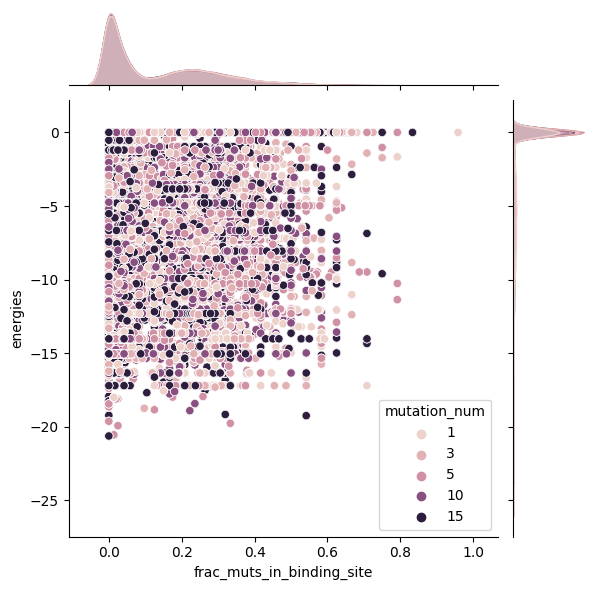

In [85]:
sns.jointplot(infom[infom['mutation_num'] > 0], x='frac_muts_in_binding_site', y='energies', hue='mutation_num')

In [86]:
info_summ

,circuit_name,mutation_num,sample_name,fold_change_std,fold_change_mean,fold_change_std_normed_bymean,overshoot_std,overshoot_mean,overshoot_std_normed_bymean,RMSE_std,...,energies_diffs_std_normed_bymean,binding_rates_dissociation_diffs_std,binding_rates_dissociation_diffs_mean,binding_rates_dissociation_diffs_std_normed_bymean,eqconstants_diffs_std,eqconstants_diffs_mean,eqconstants_diffs_std_normed_bymean,precision_times_sensitivity_std,precision_times_sensitivity_mean,robust
0,toy_mRNA_circuit_10000,0,RNA_0,0.000000,1.924510,0.000000,0.000000,0.000000,NaN,0.000000,...,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000,False
1,toy_mRNA_circuit_10000,0,RNA_1,0.000000,1.025266,0.000000,0.000000,0.765835,0.000000,0.000000,...,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.514016,False
2,toy_mRNA_circuit_10000,0,RNA_2,0.000000,0.685595,0.000000,0.000000,0.000000,NaN,0.000000,...,NaN,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000,False
3,toy_mRNA_circuit_10000,1,RNA_0,0.279723,1.908682,0.146213,0.000000,0.000000,NaN,10.475847,...,4.580995,0.147137,0.035086,4.183862,0.101196,-0.003791,-26.632678,0.000000,1.000000,False
4,toy_mRNA_circuit_10000,1,RNA_1,0.064015,0.982058,0.065033,0.387295,0.380210,1.016276,11.212211,...,4.580995,0.147137,0.035086,4.183862,0.101196,-0.003791,-26.632678,13.212774,5.549641,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,toy_mRNA_circuit_36038,10,RNA_1,0.174857,0.734715,0.237442,0.000000,0.000000,NaN,17.711883,...,3.439153,0.173954,0.061719,2.811948,0.089817,-0.001796,-49.880804,0.988171,1.814351,False
17996,toy_mRNA_circuit_36038,10,RNA_2,0.099686,0.956430,0.103986,0.417633,0.363569,1.146041,9.246410,...,3.439153,0.173954,0.061719,2.811948,0.089817,-0.001796,-49.880804,50.766936,17.167111,False
17997,toy_mRNA_circuit_36038,15,RNA_0,0.333913,1.886191,0.176620,0.000000,0.000000,NaN,9.066091,...,2.462564,0.178811,0.089430,1.994813,0.222744,0.006701,33.165453,0.000000,1.000000,False
17998,toy_mRNA_circuit_36038,15,RNA_1,0.180876,0.777251,0.232173,0.000000,0.000000,NaN,18.884299,...,2.462564,0.178811,0.089430,1.994813,0.222744,0.006701,33.165453,0.648473,1.614600,False


A look at std's

In [91]:
v = infom.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg(
    **{'frac_muts_in_binding_site' + '_std': pd.NamedAgg(column='frac_muts_in_binding_site', aggfunc='std'),
       'frac_muts_in_binding_site' + '_mean': pd.NamedAgg(column='frac_muts_in_binding_site', aggfunc='mean'),
       'frac_muts_in_binding_site' + '_std_normed_by_mean': pd.NamedAgg(column='frac_muts_in_binding_site', aggfunc=lambda x: np.std(x) / np.max([1, np.mean(x)]))})
info_summ['frac_muts_in_binding_site' + '_std'
          ] = v['frac_muts_in_binding_site' + '_std']
info_summ['frac_muts_in_binding_site' + '_mean'
          ] = v['frac_muts_in_binding_site' + '_mean']


In [89]:
info_summ

,circuit_name,mutation_num,sample_name,fold_change_std,fold_change_mean,fold_change_std_normed_bymean,overshoot_std,overshoot_mean,overshoot_std_normed_bymean,RMSE_std,...,binding_rates_dissociation_diffs_mean,binding_rates_dissociation_diffs_std_normed_bymean,eqconstants_diffs_std,eqconstants_diffs_mean,eqconstants_diffs_std_normed_bymean,precision_times_sensitivity_std,precision_times_sensitivity_mean,robust,frac_muts_in_binding_site_std,frac_muts_in_binding_site_mean
0,toy_mRNA_circuit_10000,0,RNA_0,0.000000,1.924510,0.000000,0.000000,0.000000,NaN,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000,False,NaN,0.000000
1,toy_mRNA_circuit_10000,0,RNA_1,0.000000,1.025266,0.000000,0.000000,0.765835,0.000000,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.514016,False,NaN,0.000000
2,toy_mRNA_circuit_10000,0,RNA_2,0.000000,0.685595,0.000000,0.000000,0.000000,NaN,0.000000,...,0.000000,NaN,0.000000,0.000000,NaN,0.000000,1.000000,False,NaN,0.000000
3,toy_mRNA_circuit_10000,1,RNA_0,0.279723,1.908682,0.146213,0.000000,0.000000,NaN,10.475847,...,0.035086,4.183862,0.101196,-0.003791,-26.632678,0.000000,1.000000,False,0.140964,0.126447
4,toy_mRNA_circuit_10000,1,RNA_1,0.064015,0.982058,0.065033,0.387295,0.380210,1.016276,11.212211,...,0.035086,4.183862,0.101196,-0.003791,-26.632678,13.212774,5.549641,False,0.140964,0.126447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,toy_mRNA_circuit_36038,10,RNA_1,0.174857,0.734715,0.237442,0.000000,0.000000,NaN,17.711883,...,0.061719,2.811948,0.089817,-0.001796,-49.880804,0.988171,1.814351,False,NaN,NaN
17996,toy_mRNA_circuit_36038,10,RNA_2,0.099686,0.956430,0.103986,0.417633,0.363569,1.146041,9.246410,...,0.061719,2.811948,0.089817,-0.001796,-49.880804,50.766936,17.167111,False,NaN,NaN
17997,toy_mRNA_circuit_36038,15,RNA_0,0.333913,1.886191,0.176620,0.000000,0.000000,NaN,9.066091,...,0.089430,1.994813,0.222744,0.006701,33.165453,0.000000,1.000000,False,NaN,NaN
17998,toy_mRNA_circuit_36038,15,RNA_1,0.180876,0.777251,0.232173,0.000000,0.000000,NaN,18.884299,...,0.089430,1.994813,0.222744,0.006701,33.165453,0.648473,1.614600,False,NaN,NaN


In [92]:
cols_to_norm = [
    'binding_rates_dissociation_diffs',
    'energies_diffs',
    'eqconstants_diffs',
]
for c in cols_to_norm:
    info_summ[c + '_std_normed_by_mean'] = info_summ[c + '_std'] / info_summ[c + '_mean']

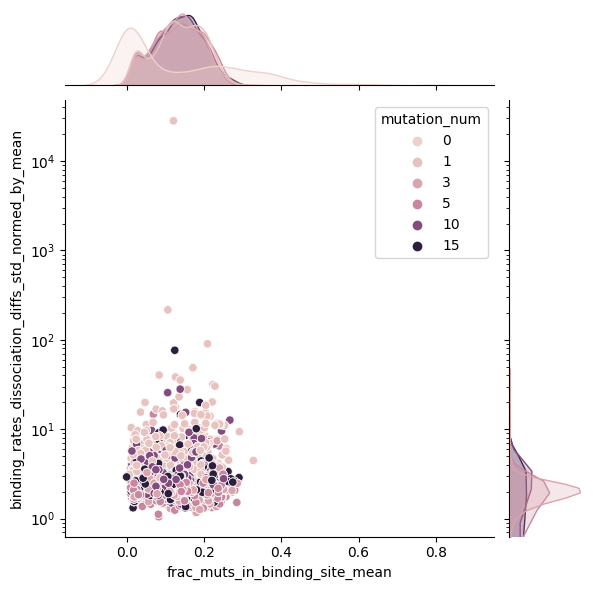

In [93]:
sns.jointplot(info_summ, x='frac_muts_in_binding_site' + '_mean', y='binding_rates_dissociation_diffs' + '_std_normed_by_mean', hue='mutation_num')
plt.yscale('log')

<AxesSubplot: xlabel='frac_muts_in_binding_site_mean', ylabel='RMSE_mean'>

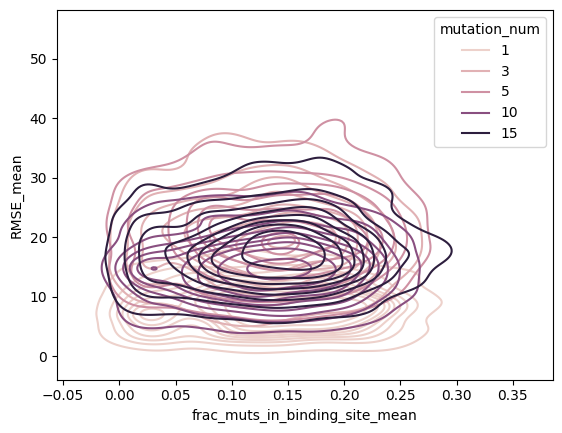

In [154]:
# sns.jointplot(info_summ[info_summ['mutation_num'] > 0], x='frac_muts_in_binding_site' + '_mean', y='RMSE' + '_mean', hue='mutation_num')
sns.kdeplot(info_summ[info_summ['mutation_num'] > 0], x='frac_muts_in_binding_site' + '_mean', y='RMSE' + '_mean', hue='mutation_num')

## Removing null circuit

In [61]:
null_circuit = infom.groupby(['circuit_name', 'mutation_name'], as_index=False).agg({'energies': 'mean'})
null_circuit = null_circuit[(null_circuit['energies'] == 0)].iloc[0]
null_circuit = infom[(infom['circuit_name'] == null_circuit['circuit_name']) & (infom['mutation_name'] == null_circuit['mutation_name'])]

In [60]:
infom['energies']

0          0.0
1          0.0
2          0.0
3          0.0
4          0.0
          ... 
3266995    0.0
3266996    0.0
3266997    0.0
3266998    0.0
3266999    0.0
Name: energies, Length: 3267000, dtype: float64

In [62]:
null_cols = [
    'overshoot',
    'RMSE',
    'steady_states',
    'initial_steady_states',
    'max_amount',
    'min_amount',
    'response_time_wrt_species-6'
]
info_null = deepcopy(infom)
sample_names = info['sample_name'].unique()
for s in sample_names:
    for c in relevant_cols:
        info_null.loc[info_null['sample_name'] == s, c] = info_null[info_null['sample_name']
                                                                    == s][c] / np.where(
            null_circuit[null_circuit['sample_name'] == s][c].values[0] == 0, 1, null_circuit[null_circuit['sample_name'] == s][c].values[0])


In [64]:
for c in relevant_cols:
    infom[c + '_null'] = info_null[c]

In [27]:
# null_cols = [
#     'overshoot',
#     'RMSE',
#     'steady_states',
#     'initial_steady_states',
#     'max_amount',
#     'min_amount',
#     'response_time_wrt_species-6'
# ]
# info_null = deepcopy(infom)
# sample_names = info['sample_name'].unique()
# for s in sample_names:
#     for c in null_cols:
#         info_null.loc[info_null['sample_name'] == s, c] = info_null[info_null['sample_name']
#                                                                     == s][c] - null_circuit[null_circuit['sample_name'] == s][c].values[0]


In [41]:
# output_diff = info_null[info_null['sample_name'] == s]['steady_states'] - \
#         info_null[info_null['sample_name'] == s]['initial_steady_states']
# output_diff.to_numpy()

array([  6.021116,   6.031516,   6.033638, ...,  -2.107976, -11.56203 ,
         1.477064])

In [45]:

# info_null['fold_change'] = info_null['steady_states'] / \
#     info_null['initial_steady_states']
# signal_diff = info_null[info_null['sample_name'] == 'RNA_0']['steady_states'] - \
#     info_null[info_null['sample_name'] == 'RNA_0']['initial_steady_states']

# for s in info_null['sample_name'].unique():
#     output_diff = info_null[info_null['sample_name'] == s]['steady_states'] - \
#         info_null[info_null['sample_name'] == s]['initial_steady_states']
#     info_null.loc[info_null['sample_name'] == s, 'precision_wrt_species-6'] = np.divide(1, np.absolute(
#         np.divide(
#             output_diff / info_null[info_null['sample_name'] == s]['initial_steady_states'],
#             (signal_diff / info_null[info_null['sample_name']
#             == 'RNA_0']['initial_steady_states']).values
#         )
#     ))


In [52]:
# peaks = np.array([np.where(
#     info_null[info_null['sample_name'] ==
#               s]['initial_steady_states'] < info_null[info_null['sample_name'] == s]['steady_states'],
#     info_null[info_null['sample_name'] == s]['max_amount'] - info_null[info_null['sample_name']
#                                                                        == s]['min_amount'] + info_null[info_null['sample_name'] == s]['initial_steady_states'],
#     info_null[info_null['sample_name'] == s]['min_amount'] - info_null[info_null['sample_name']
#                                                                        == s]['max_amount'] + info_null[info_null['sample_name'] == s]['initial_steady_states']
# ) for s in info_null['sample_name'].unique()])

array([[-18.75186 , -19.50257 , -19.78903 , ..., -20.149486, -30.81131 ,
         -9.6212  ],
       [-13.860429, -13.191486, -12.935372, ..., -52.367022, -46.97822 ,
        -59.641966],
       [-53.028438, -53.586383, -53.796898, ..., -12.075474,   9.501392,
        -25.663057]])

In [54]:
# signal_diff = peaks[0] - info_null[info_null['sample_name']
#                                    == 'RNA_0']['initial_steady_states']
# output_diff = peaks - np.array([info_null[info_null['sample_name'] == s]
#                                ['initial_steady_states'] for s in info_null['sample_name'].unique()])

# for i, s in enumerate(info_null['sample_name'].unique()):
#     info_null.loc[info_null['sample_name'] == s, 'sensitivity_wrt_species-6'] = np.absolute(np.divide(
#         output_diff[i] / info_null[info_null['sample_name']
#                                    == s]['initial_steady_states'],
#         signal_diff / info_null[info_null['sample_name']
#                                 == 'RNA_0']['initial_steady_states']
#     )
#     )


In [59]:
info_summ_null = info_null.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg(**named_aggs)

### Visualisations without null circuit

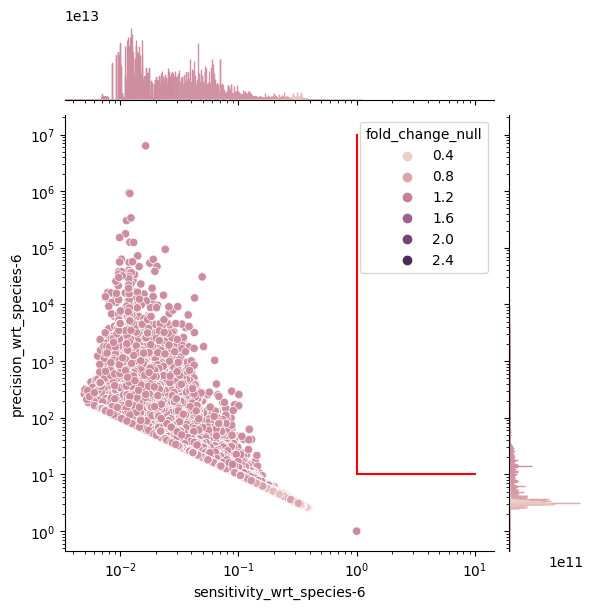

In [65]:
sns.jointplot(infom[infom['energies_idx'] == 'energies_0-0'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='fold_change_null')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

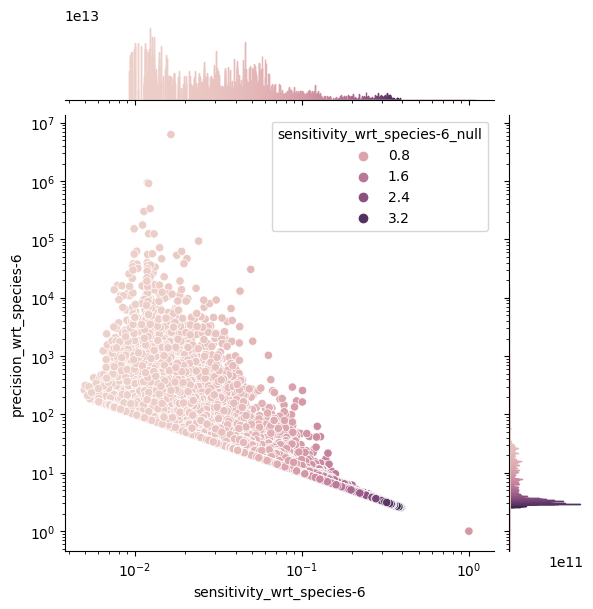

In [83]:
sns.jointplot(infom[infom['energies_idx'] == 'energies_0-0'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='sensitivity_wrt_species-6_null')
plt.xscale('log')
plt.yscale('log')


In [99]:
top_circuits = info[info['sample_name'] != 'RNA_0'].sort_values('sp_distance')
top_circuits.iloc[:8]

,circuit_name,mutation_name,mutation_num,mutation_type,mutation_positions,path_to_template_circuit,name,interacting,self_interacting,num_interacting,...,binding_site_group_range_2-0,binding_sites_count_2-1,binding_sites_idxs_2-1,binding_sites_groups_2-1,binding_site_group_range_2-1,binding_sites_count_2-2,binding_sites_idxs_2-2,binding_sites_groups_2-2,binding_site_group_range_2-2,sp_distance
168107,toy_mRNA_circuit_21566,RNA_0_m3-3,3,"[5, 4, 11]","[12, 3, 13]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_21566,[[0 1]\n [0 2]\n [1 2]],[[0 0]],3,...,"[(5, 11), (14, 16)]",[9],"[[9, 10, 11, 12, 13, 14, 15, 16, 17]]",1,"[(9, 17)]",[],[],0,[],0.849300
209408,toy_mRNA_circuit_24706,RNA_2_m10-1,10,"[11, 8, 6, 4, 11, 5, 11, 0, 10, 8]","[16, 3, 1, 4, 7, 12, 9, 0, 14, 13]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_24706,[[0 1]\n [0 2]\n [1 2]],[[0 0]],3,...,"[(2, 5), (7, 13)]","[4, 10]","[[4, 5, 6, 7], [10, 11, 12, 13, 14, 15, 16, 17...",2,"[(4, 7), (10, 19)]",[],[],0,[],0.854690
143281,toy_mRNA_circuit_19768,RNA_2_m1-5,1,[8],[11],data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_19768,[[0 1]],[[0 0]\n [1 1]\n [2 2]],1,...,[],[],[],0,[],[12],"[[3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]]",1,"[(3, 14)]",0.855706
143302,toy_mRNA_circuit_19768,RNA_2_m3-4,3,"[1, 3, 11]","[18, 14, 5]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_19768,[[0 1]],[[0 0]\n [1 1]\n [2 2]],1,...,[],[],[],0,[],[8],"[[11, 12, 13, 14, 15, 16, 17, 18]]",1,"[(11, 18)]",0.856165
180629,toy_mRNA_circuit_22658,RNA_1_m10-7,10,"[5, 8, 8, 5, 4, 4, 6, 7, 9, 11]","[15, 17, 2, 8, 4, 16, 1, 18, 0, 14]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_22658,[[0 1]\n [0 2]\n [1 2]],[[0 0]],3,...,"[(10, 16)]","[5, 7]","[[4, 5, 6, 7, 8], [10, 11, 12, 13, 14, 15, 16]]",2,"[(4, 8), (10, 16)]",[],[],0,[],0.856825
143311,toy_mRNA_circuit_19768,RNA_2_m3-7,3,"[11, 1, 1]","[8, 10, 4]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_19768,[[0 1]],[[0 0]\n [1 1]\n [2 2]],1,...,[],[],[],0,[],[8],"[[8, 9, 10, 11, 12, 13, 14, 15]]",1,"[(8, 15)]",0.857348
143335,toy_mRNA_circuit_19768,RNA_2_m5-7,5,"[5, 2, 6, 7, 8]","[15, 7, 9, 3, 19]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_19768,[[0 1]],[[0 0]\n [1 1]\n [2 2]],1,...,[],[],[],0,[],[8],"[[1, 2, 3, 4, 5, 6, 7, 8]]",1,"[(1, 8)]",0.857718
276811,toy_mRNA_circuit_2983,RNA_1_m10-3,10,"[9, 3, 8, 1, 9, 5, 3, 11, 11, 6]","[6, 1, 18, 5, 15, 2, 7, 0, 10, 8]",data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_2983,[[0 1]],[[0 0]\n [1 1]\n [2 2]],1,...,[],[],[],0,[],[10],"[[8, 9, 10, 11, 12, 13, 14, 15, 16, 17]]",1,"[(8, 17)]",0.860825
